## MSM analysis using structural features single trajectory 

## <center>1. Boring stuff first</center>
-----------------------------------------

#### 1.1 First, imports for analyzing trajectory data

In [ ]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

# Builtins
from pprint import pprint
from itertools import chain
import pathlib
# Who needs these!?
import warnings
warnings.filterwarnings('ignore')

# Installed
import pandas
import seaborn
from scipy.stats import pearsonr

seaborn.set(font_scale=1.7)
seaborn.set_style("ticks", {
    "font.family" : ["serif"],
    #"font.scale"  : "1.7",
    "font.serif"  : ["Times New Roman"]
})

# For coloring clustercenters onto TICA
# density map with grey-low to pink-high
cc_color = "blue"

# Mine
import aswa_tools

# TODO use a helper function to
# export common packages to top
# namespace and keep rest of aswa
# bound to parent module name
import aswanalysis as aswa
matplotlib = aswa.plots.matplotlib
plt        = aswa.plots.plt
mdtraj     = aswa.mdtraj
pyemma     = aswa.pyemma
coor       = aswa.coor
np         = aswa.np
msm        = aswa.msm
subprocess = aswa.subprocess
shlex      = aswa.shlex

#### 1.2 File & Dataset Organization for reading

<center>Import a python file written specifically to navigate the data we want to process</center>

In [ ]:
from msm_datasets import *

_model_name = lambda feat, kwargs: "__".join([feat] + [
    "%s-%s"%(str(k),str(v)) for k,v in kwargs.items()])

# extra helpers for later
_steps_to_ns    = lambda s: s * 0.2

#### 1.3 Load multiple datasets into structure representing the workflows

<center>Datasets will be "lined up" for epoch-to-epoch comparison even if different timestep, n replicates, etc.</center>

In [ ]:
# filterkey prevents loading unwanted files
#   - the data will be trimmed down and marked with tag "stride"
#     if already happened, we don't include in list of source data
aswa.create_trajlist(workflows, filterkey=lambda fnm: "stride" not in fnm)
aswa.assign_stride(workflows)
aswa.determine_epochsize(workflows)
aswa.determine_datashape(workflows, atomselection=heavies)

#### 1.4 Copy datasets to prepare for different analyses

In [ ]:
feature_selections = dict(
    invca    = {"add_inverse_distances": {"select_Ca": None}},
    invca_ba = [
        {"add_inverse_distances": {"select_Ca": None}},
        #{"add_chi1_torsions": None},
        {"add_sidechain_torsions": None,
         "kwargs": {"which": ["chi1"]}},
        {"add_backbone_torsions": None},
])

all_models = dict(
    {kk: dict(
            anton_longtraj  = {"atn": aswa_tools.copy_include(workflows["atn"])},
            openmm_longtraj = {"omm": aswa_tools.copy_include(workflows["omm"])},
            umi_Ca          = {"omm": aswa_tools.copy_include(workflows["umi_Ca"])},
            umi_CB          = {"omm": aswa_tools.copy_include(workflows["umi_CB"])},
            openmm_fixed    = {"omm": aswa_tools.copy_include(workflows["omm_fixed"])},
            #Ca_workflow     = analtools.copy_include(
            #    {k:workflows[k] for k in ["xma_Ca", "umi_Ca"]}),
            #CB_workflow     = analtools.copy_include(
            #    {k:workflows[k] for k in ["xma_CB", "umi_CB"]}),
            #all_data        = analtools.copy_include(workflows),
        ) for kk in feature_selections
})

for feat, featz in feature_selections.items():
    for nm, dataset in all_models[feat].items():
        dataset["data_reader"], dataset["data_order"] = aswa.prepare_tica_inputs(
            dataset, topologies[heavies], features=featz)

#### 1.5 Define the calculations we will do

<center>this was finalized after an initial run-through of the notebook operations</center>


If you use this to do a similar modeling effort, just pick some values as the "chosen" values. Carefully proceed through the noteboook and investigate/make changes to the early steps, and iterate. The notebook session is restored by doing 2 operations that MUST be separate:

 - loading a "thin" session without any PyEMMA models
     - first time: no notebook session file, creating from scratch
     - later: when you replace values, you will have to delete the
       notebook file and re-run with your updated values since without
       deleting notebook, the same original values will be re-loaded
     - The notebook CANNOT be saved after section 1 since PyEMMA objects
       are not pickleable.
 - in each later section, we will load PyEMMA models into the datastructure



The mechanism used for each does not capture the other. In order to make this work AND provide final results after you have carefully analyzed the system, all definitions are provided at the top of the notebook here. Thus they must be adjusted from some initial, placeholding values.

1. TICA starts us off. We will look at how well feature space variance is captured at different lags.
2. Not yet used... VAMP tells us which feature is the best for a given lag.
3. Choose a TICA model that provides reduced coordinates.

In [5]:
# PARAMETERS TO SWEEP
tica_lags  = [1, 3, 10, 25, 50, 100, 250] # 0.2, 0.6, 2, 5, 10, 20, 50 nanoseconds
# Look in folder earlier_pictures
# to see that we do not need to try
# using the larger numbers of clusters
#n_clusters = [50, 100, 200, 400, 800]  # for k-means clustering
#d_clusters = [1.0, 1.25, 1.75, 2.5]    # for regspace clustering
n_clusters = [25, 50, 100, 200, 300]    # for k-means clustering
d_clusters = [1.3, 2.0, 2.75, 3.5, 5]   # for regspace clustering
feat_CB    = "invca_ba"
feat_Ca    = "invca"
n_tica_dim = 3

# We are only making models from datasets
# with only long-enough trajectories
included   = lambda nm: nm.endswith("longtraj") or nm.startswith("umi") or nm.startswith("openmm")

# THESE: Guess First
#       Update Later
chosen_lag = 100 # from tica, collective coords for clustering
keep_dims  = 3   # from tica cumvar, n dims of collective coords
chosen_tau = 100 # from its, lag for MSM
chosen_k   = 50 # from k-means, n states for MSM
chosen_d   = 2.75 # from reg-space, n states for MSM
chosen_clustering = "cluster_regspace"
    
# Each calculation sweep is set up here
# TICA
calc_name = "tica"
parameter = dict(lag=tica_lags)
wkf_pars  = lambda nm: {"reversible": False} if nm.endswith("longtraj") else dict()
fixed     = dict(dim=15) # more than will be used to get good CumVar plot
input_source = "data_reader"
input_key = None
input_val = None
aswa_tools.scan_single_parameter(calc_name, all_models, parameter, fixed, wkf_pars, included, input_source, input_key, input_val)

# VAMP
calc_name = "vamp"
parameter = dict(lag=tica_lags)
wkf_pars  = lambda x: dict()
fixed     = dict(dim=15) # more than will be used to get good CumVar plot
input_source = "data_reader"
input_key = None
input_val = None
aswa_tools.scan_single_parameter(calc_name, all_models, parameter, fixed, wkf_pars, included, input_source, input_key, input_val)

# CLUSTER_KMEANS
calc_name = "cluster_kmeans"
parameter = dict(k=n_clusters)
fixed     = dict(max_iter=100)
wkf_pars  = lambda nm: {"stride": 5} if nm.endswith("longtraj") else dict()
input_source = "tica"
input_key = "lag"
input_val = chosen_lag
aswa_tools.scan_single_parameter(calc_name, all_models, parameter, fixed, wkf_pars, included, input_source, input_key, input_val)

# CLUSTER_REGSPACE
calc_name = "cluster_regspace"
# This is VERY dependent on data,
# calculated right before clustering
parameter = dict(dmin=d_clusters)
fixed     = dict(max_iter=100, max_centers=1000, min_counts=[3, 10])
wkf_pars  = lambda nm: {"stride": 5} if nm.endswith("longtraj") else dict()
input_source = "tica"
input_key = "lag"
input_val = chosen_lag
aswa_tools.scan_single_parameter(calc_name, all_models, parameter, fixed, wkf_pars, included, input_source, input_key, input_val)

# ITS of Many MSMs
#calc_name = "msm_its"
#parameter = dict()
#fixed     = dict(lags=tica_lags, reversible=False, nits=3, errors='bayes',)
#wkf_pargs = lambda nm: dict()
#input_source = chosen_clustering
#input_key = "dmin"
#aswa_tools.scan_single_parameter(calc_name, all_models, parameter, fixed, wkf_pars, included, input_source, input_key, input_val)
#
 #               pyemma.msm.its(
  #                  setup["result"].dtrajs,
   #                 lags=tica_lags,
    #                reversible=False,
     #               nits=3,
      #              errors='bayes',
       #     
        #        ),

for setup in all_models[feat_CB][nm]["tica"]:
    if setup["kwargs"]["lag"] == chosen_lag:
        if setup["result"]:
            tica_data_CB  = np.concatenate(setup["result"].get_output())

for setup in all_models[feat_Ca][nm]["tica"]:
    if setup["kwargs"]["lag"] == chosen_lag:
        if setup["result"]:
            tica_data_Ca  = np.concatenate(setup["result"].get_output())

# TODO FUTURE asyncio usage to wait
# on later initial task completion
nm = "anton_longtraj"
featurizer_Ca = all_models[feat_Ca][nm]["data_reader"]
feat_data_Ca  = np.concatenate(featurizer_Ca.get_output())
featurizer_CB = all_models[feat_CB][nm]["data_reader"]
feat_data_CB  = np.concatenate(featurizer_CB.get_output())

## <center>2. Dimension Reduction</center>
-------------------

#### 2.1 Call TICA & VAMP

<center><mark><span style="color:darkred">Creating folder structure & making models (outside notebook), or loading pre-existing results (inside notebook)</span></mark></center>

In [6]:
da = pathlib.Path("analysis")
if not da.is_dir():
    da.mkdir()

# FIXME Dask IT!!
for feat,nm,dataset in aswa_tools.iter_models(all_models):
    dds = da / nm
    
    dtica = dds / "tica"
    ftica = dtica / "results.pyemma"
    
    dvamp = dds / "vamp"
    fvamp = dvamp / "results.pyemma"
    
    if not dds.is_dir():
        dds.mkdir()
    if not dtica.is_dir():
        dtica.mkdir()
    if not dvamp.is_dir():
        dvamp.mkdir()

    for setup in dataset["tica"]:
        _ftica = ftica.with_suffix(".%s"%_model_name(feat, setup["kwargs"]))
        
        if _ftica.is_file():
            #print("Found Results File: {}".format(_ftica))
            setup["result"] = pyemma.load(_ftica)
            
        else:
            #print("Calculating and Saving to File: {}".format(_ftica))
            setup["result"] = coor.tica(setup["input"], **setup["kwargs"])
            setup["result"].save(_ftica, save_streaming_chain=True)

#    for setup in dataset["vamp"]:
 #       _fvamp = fvamp.with_suffix(".%s"%_model_name(feat, setup["kwargs"]))
  #      
   #     if _fvamp.is_file():
    #        print("Found Results File: {}".format(_fvamp))
     #       setup["result"] = pyemma.load(_fvamp)
      #      
       # else:
        #    print("Calculating and Saving to File: {}".format(_fvamp))
         #   setup["result"] = coor.vamp(setup["input"], **setup["kwargs"])
          #  setup["result"].save(_fvamp, save_streaming_chain=True)

In [7]:
# TODO also use asyncio to finalize load on
#      on later calculation as below
nm = "anton_longtraj"
for setup in all_models[feat_CB][nm]["tica"]:
    if setup["kwargs"]["lag"] == chosen_lag:
        tica_data_CB  = np.concatenate(setup["result"].get_output())

for setup in all_models[feat_Ca][nm]["tica"]:
    if setup["kwargs"]["lag"] == chosen_lag:
        tica_data_Ca  = np.concatenate(setup["result"].get_output())

#### 2.2 Plot VAMP Score for every **feature set** with each lag

<center>Shows how well the **feature set** subspace kinetic what? </center>

#### 2.3 Plot TICA Cumulative Variance for every **lag** with each **feature set**

<center>Shows how well the TICA dimensions preserve feature variance when made with different lags</center>

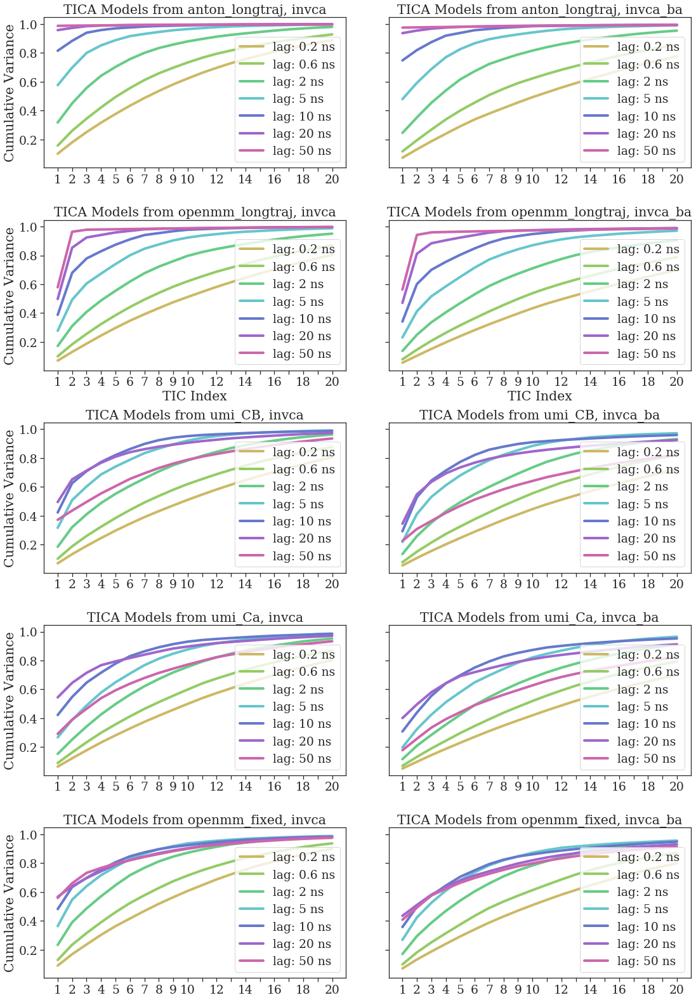

In [8]:
plot_these = ["anton_longtraj","openmm_longtraj","umi_CB","umi_Ca","openmm_fixed"]

plt.close()
fig, axes = plt.subplots(len(plot_these),2,figsize=(16,22), sharey=True)

#cc2 = seaborn.cubehelix_palette(14, start=9, rot=8, dark=0.5, light=.95)
from collections import deque
cc2 = deque(seaborn.hls_palette(len(tica_lags)+1, l=0.6, s=0.5))
cc2.rotate(-1) # red is first and confusing the appearance, make last

n_dim = 20

for k,feat in enumerate(all_models):
    for i,nm in enumerate(plot_these):
        for j,setup in enumerate(all_models[feat][nm]["tica"]):
            seaborn.lineplot(
                range(1,1+n_dim),
                setup["result"].cumvar[:n_dim],
                color=cc2[j],#cc2[1::2][j],
                linewidth=4,
                label="lag: %d ns" % int(0.2 * setup["kwargs"]["lag"]) if int(0.2 * setup["kwargs"]["lag"]) > 1 else "lag: %0.1f ns" % (0.2 * setup["kwargs"]["lag"]),
                ax=axes[i][k]
            )
            axes[i][k].set_title("TICA Models from %s, %s" % (nm,feat))
            if i == 1: axes[i][k].set_xlabel("TIC Index")
            if k == 0: axes[i][k].set_ylabel("Cumulative Variance")
            axes[i][k].set_xticks(range(1,1+n_dim))
            axes[i][k].set_xticklabels(["1"]+[str(i) if (i<=10 or i%2==0) else " " for i in range(2,1+n_dim)])

plt.tight_layout()
plt.savefig("analysis/tica-longtrajs_umi-2feats-cumvar.png", dpi=1200)


It looks like using 20 ns lag time captures all of the variance in feature values seen for the choice of either:
 - Inverse C$\alpha$ distances
 - Inverse C$\alpha$ distance + backbone $\phi$, $\psi$ angles + $\chi$$_1$ angles

For a number of practical reasons, we choose the shortest suitable lag time.
 - More countable transitions
 - Include some faster processes without losing model quality

We want our model to include as much information about the original system as possible, which is governed by the feature space.
A reasonable number of TICA vectors (3) for either choice presented can recover essententially the entire original feature space so we choose the more detailed one (with inverse distances plus angles). 

With more sophisticated protein systems it can be challenging to find feature spaces that are well-characterized by a small number of eigenvectors using TICA. We are going to cluster our data after it is projected into these eigenvectors, and we want to use as few as possible (i.e. reduce the data as much as possible) while still preserving an accurate map to the feature space observed in simulation.

Our case with 3 vectors recovering >99% of the feature space will not likely occur with many other systems of 10 or more residues. 

#### 2.4 What features are correlated with each TIC component?

<center><mark><span style="color:darkred">Calculate Pearson Coefficient for each feature with each of top 3 TIC</span></mark></center>

<center> - we could look at unmodeled features as well, we just conveniently have these feature trajectories</center>

In [9]:
nm = "anton_longtraj"

feature_CB_TIC_correlation = np.zeros((featurizer_CB.dimension(), n_tica_dim))
feature_Ca_TIC_correlation = np.zeros((featurizer_Ca.dimension(), n_tica_dim))

for i in range(featurizer_CB.dimension()):
    for j in range(n_tica_dim):
        feature_CB_TIC_correlation[i, j] = pearsonr(
            feat_data_CB[:, i],
            tica_data_CB[:, j])[0]

for i in range(featurizer_Ca.dimension()):
    for j in range(n_tica_dim):
        feature_Ca_TIC_correlation[i, j] = pearsonr(
            feat_data_Ca[:, i],
            tica_data_Ca[:, j])[0]

<center>Plot the correlations as a heatmap, here these are from C$\alpha$ inverse distances only</center>

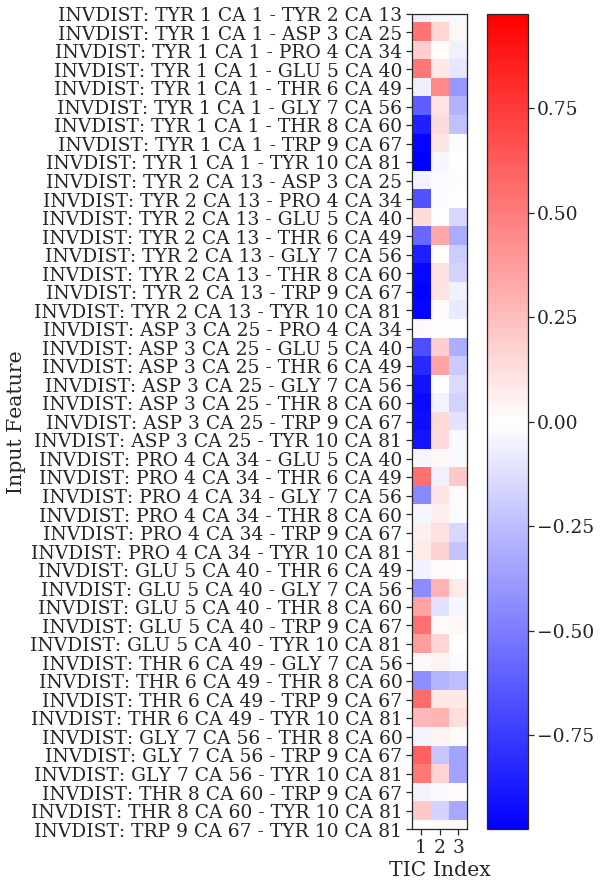

In [10]:
vm = abs(feature_Ca_TIC_correlation).max()

plt.close()
plt.figure(figsize=(7,15))

hm = plt.imshow(feature_Ca_TIC_correlation, vmin=-vm, vmax=vm, cmap='bwr')
plt.xticks(ticks=range(n_tica_dim), labels=["%d"%i for i in range(1,1+n_tica_dim)])
plt.xlabel('TIC Index')

plt.yticks(ticks=range(featurizer_Ca.dimension()), labels=featurizer_Ca.describe()[1:])
plt.ylabel('Input Feature')

plt.colorbar(hm)
plt.savefig("analysis/tica-anton-Calpha-featcorrelations.png", dpi=1200)

Plot the correlations as a heatmap, here C𝛼 inverse distances + $\phi$, $\psi$, $\chi$$_1$ angles

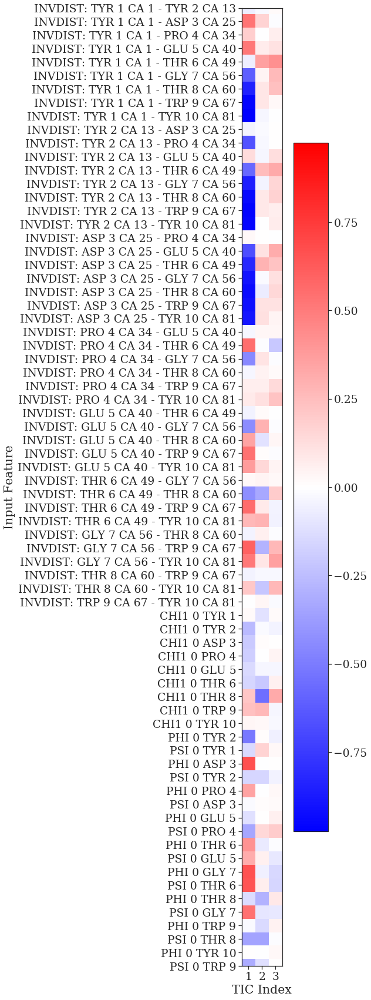

In [11]:
vm = abs(feature_CB_TIC_correlation).max()

plt.close()
plt.figure(figsize=(7,30))

hm = plt.imshow(feature_CB_TIC_correlation, vmin=-vm, vmax=vm, cmap='bwr')
plt.xticks(ticks=range(n_tica_dim), labels=["%d"%i for i in range(1,1+n_tica_dim)])
plt.xlabel('TIC Index')

plt.yticks(ticks=range(featurizer_CB.dimension()), labels=featurizer_CB.describe()[1:])
plt.ylabel('Input Feature')

plt.colorbar(hm)
plt.savefig("analysis/tica-anton-CalphaPhiPsiChi1-featcorrelations.png", dpi=1200)

#### 2.5 Check of TICA against our intuitive unfolding coordinate

It looks terrible

In [12]:
us_per_step_anton = 0.0002
traj_file_anton = workflows["atn"]["filename"]
top_file_anton  = topologies[heavies]

label_alphies   = "Cα RMSD [Å]"
label_timesteps = "Time [μs]"

folded_file     = reference[heavies]
folded_heavies  = mdtraj.load(folded_file)
folded_alphies  = folded_heavies.atom_slice(
    folded_heavies.topology.select("name CA"))

traj_anton_heavies = mdtraj.load(traj_file_anton, top=top_file_anton)
traj_anton_alphies = traj_anton_heavies.atom_slice(
    traj_anton_heavies.topology.select("name CA"))

anton_rmsd_df = pandas.DataFrame({
    label_alphies   : mdtraj.rmsd(traj_anton_alphies, folded_alphies) * 10,
    label_timesteps : [i * us_per_step_anton
        for i in range(len(traj_anton_heavies))]
})

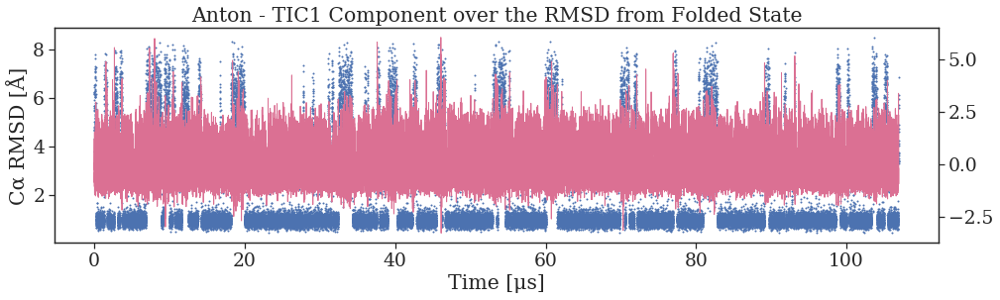

In [13]:
# This data looks terrible
plt.close()
plt.figure(figsize=(16, 4))

ax = seaborn.scatterplot(
    x=anton_rmsd_df[label_timesteps][::10],
    y=anton_rmsd_df[label_alphies][::10],
    linewidth=0,
    s=4,
    #data=traj_rmsd_df,
    legend=False,
)

ax2 = ax.twinx()

seaborn.lineplot(
    x=anton_rmsd_df[label_timesteps][::10],
    y=tica_data_CB[:,1][::10],
    ax=ax2,
    color="palevioletred",
    linewidth=1,
)

ax2.set_ylabel="TIC1 Coordinate"
ax.set_title("Anton - TIC1 Component over the RMSD from Folded State")
plt.savefig("analysis/tica-rmsd-heavyatoms-anton-full.png", dpi=1200)

#### 2.5 Check out the TICA Energy Landscape

<center>From more detailed features</center>

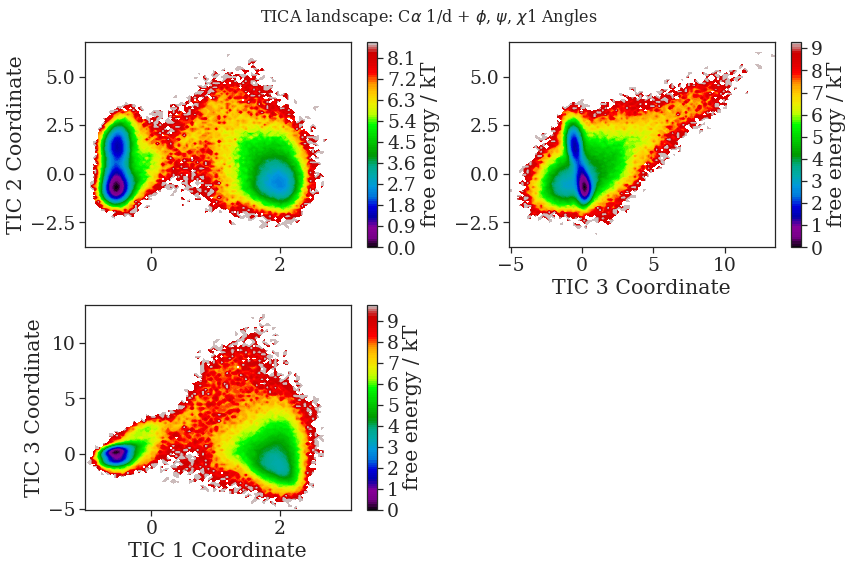

In [14]:
plt.close()
fig, axes = plt.subplots(2, 2, figsize=(12,8))

pyemma.plots.plot_free_energy(*tica_data_CB[:,:2].T,    ax=axes[0][0])
pyemma.plots.plot_free_energy(*tica_data_CB[:,[0,2]].T, ax=axes[1][0])
pyemma.plots.plot_free_energy(*tica_data_CB[:,[2,1]].T, ax=axes[0][1])

axes[1][0].set_xlabel("TIC 1 Coordinate")
axes[0][0].set_ylabel("TIC 2 Coordinate")
axes[1][0].set_ylabel("TIC 3 Coordinate")
axes[0][1].set_xlabel("TIC 3 Coordinate")

fig.delaxes(axes[1][1])
plt.suptitle("TICA landscape: C"+r"$\alpha$ 1/d + $\phi$, $\psi$, $\chi$" + "1 Angles", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.savefig("analysis/tica-anton-CalphaPhiPsiChi1-010212landscapes.png", dpi=1200)

<center>From less-detailed features</center>

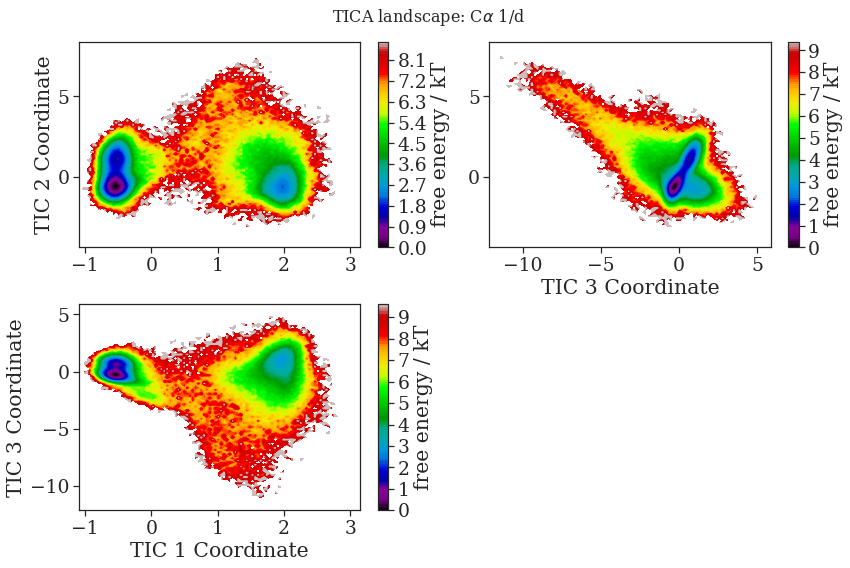

In [15]:
plt.close()
fig, axes = plt.subplots(2, 2, figsize=(12,8))

pyemma.plots.plot_free_energy(*tica_data_Ca[:,:2].T,    ax=axes[0][0])
pyemma.plots.plot_free_energy(*tica_data_Ca[:,[0,2]].T, ax=axes[1][0])
pyemma.plots.plot_free_energy(*tica_data_Ca[:,[2,1]].T, ax=axes[0][1])

axes[1][0].set_xlabel("TIC 1 Coordinate")
axes[0][0].set_ylabel("TIC 2 Coordinate")
axes[1][0].set_ylabel("TIC 3 Coordinate")
axes[0][1].set_xlabel("TIC 3 Coordinate")

fig.delaxes(axes[1][1])

plt.suptitle("TICA landscape: C"+r"$\alpha$ 1/d", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.savefig("analysis/tica-anton-Calpha-010212landscapes.png", dpi=1200)

#### Phase 1 Workloads on TICA landscape

05-12-19 12:30:51 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[14] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features
05-12-19 12:31:14 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[17] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features


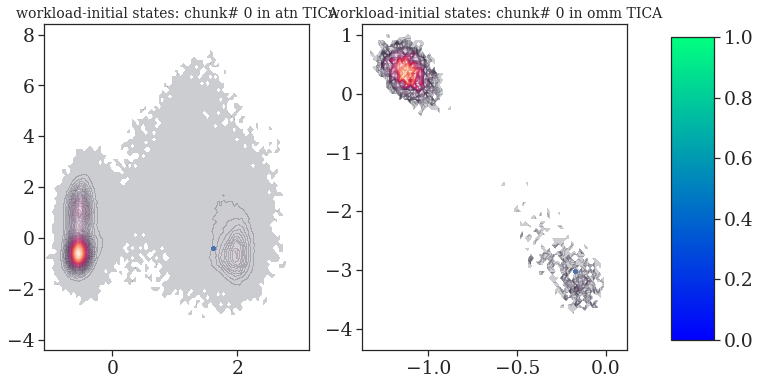

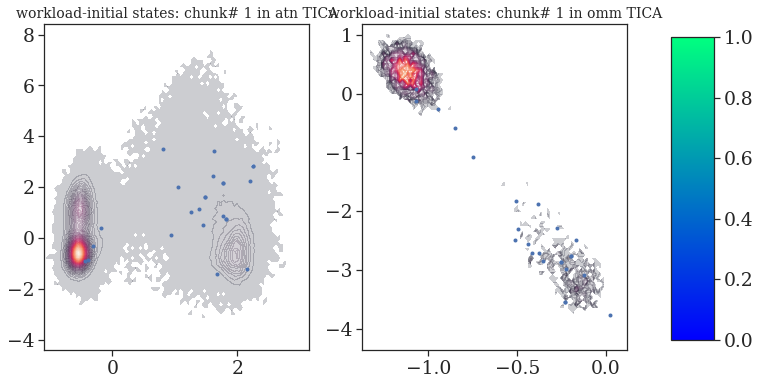

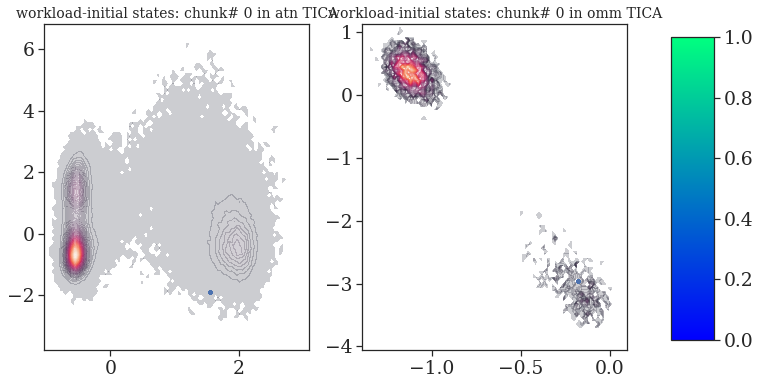

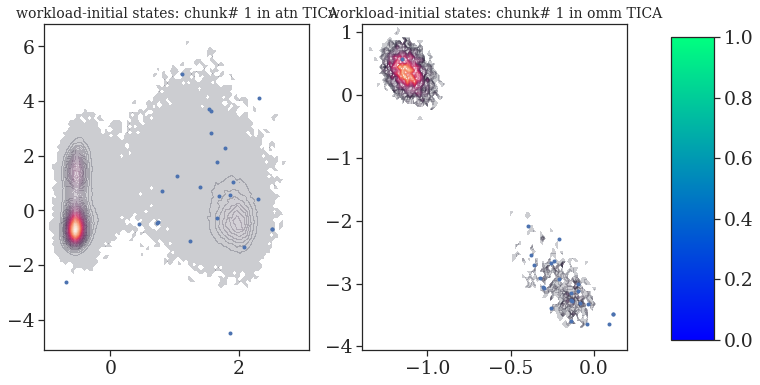

In [16]:
for feat,nm in [("invca","xma_Ca"), ("invca_ba","xma_CB")]:
    
    dds = da / nm
    if not dds.is_dir():
        dds.mkdir()
    
    w = workflows[nm]
    
    featurizer   = pyemma.coordinates.featurizer(topologies[heavies])
    aswa.apply_feat_part(featurizer, feature_selections[feat])
    feature_data = pyemma.coordinates.source(w["tica_inputs"], featurizer)

    master_tica  = dict(
        atn = aswa_tools.get_matching_input(
            all_models[feat]["anton_longtraj"]["tica"],
            key="lag", val=chosen_lag),
        omm = aswa_tools.get_matching_input(
            all_models[feat]["openmm_longtraj"]["tica"],
            key="lag", val=chosen_lag),
    )
    
    workflow_in_master_tica = {
        k: v.transform(feature_data.get_output())
        for k,v in master_tica.items()
    }
    
    master_in_master_tica   = {
        k: v.get_output([0,1])[0]
        for k,v in master_tica.items()
    }

    aswa.bind_ttraj_results({nm: w}, [nm], workflow_in_master_tica["atn"])
    
    for iw,(r_start,r_stop) in enumerate(aswa_tools.partition_workflow(w)):
        if iw > 1:
            break

        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
        for i,wnm in enumerate(["atn","omm"]):#workflow_in_master_tica:
            
            initials_in_master_tica = np.concatenate([
                ttj[0,:2][np.newaxis,:]
                for ttj in workflow_in_master_tica[wnm][r_start:r_stop]
            ])
            
            pyemma.plots.plot_density(
                *master_in_master_tica[wnm].T,
                ax=ax[i],
                alpha=0.2,
                cbar=False
            )
            sc = ax[i].scatter(
            #seaborn.scatterplot(
                #x=workload_in_master_tica.T[0],
                #y=workload_in_master_tica.T[1],
                x=initials_in_master_tica.T[0],
                y=initials_in_master_tica.T[1],
                #ax=ax,
                linewidth=0,
                s=16,
            )
            sc.set_cmap("winter")
            ax[i].set_title("workload-initial states: chunk# %d in %s TICA"%(iw,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.8)
        cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
        fig.colorbar(sc, cax=cbar_ax)
        
        #cb = plt.colorbar(sc)
        #cb.ax.set_ylabel("frame number")
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analysis/%s/initialstates-%d-chunk_on_tica_landscape.png"%(nm, iw), dpi=900)

05-12-19 12:31:46 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[20] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features
05-12-19 12:32:12 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[22] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features


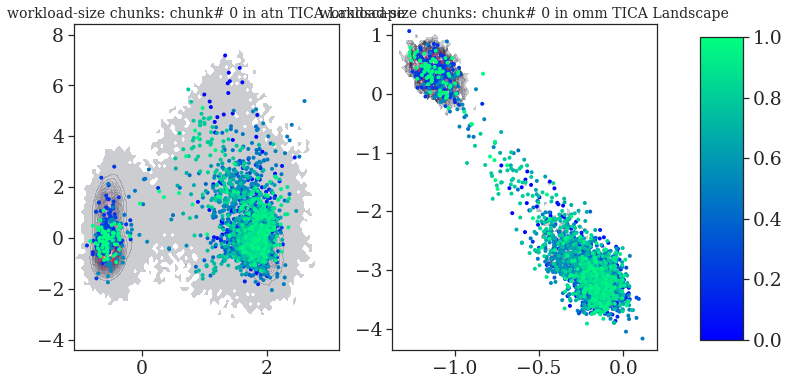

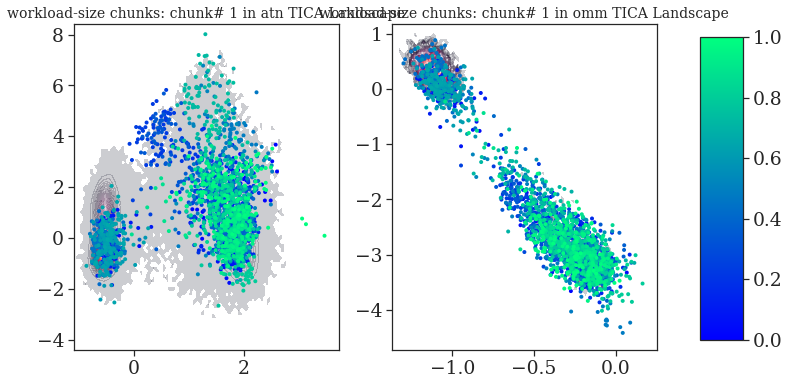

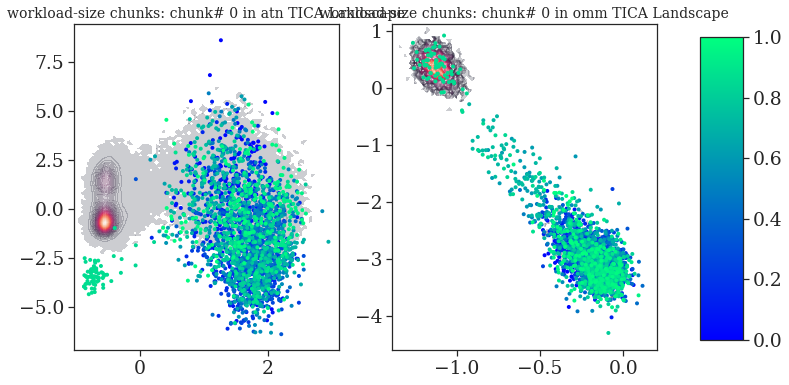

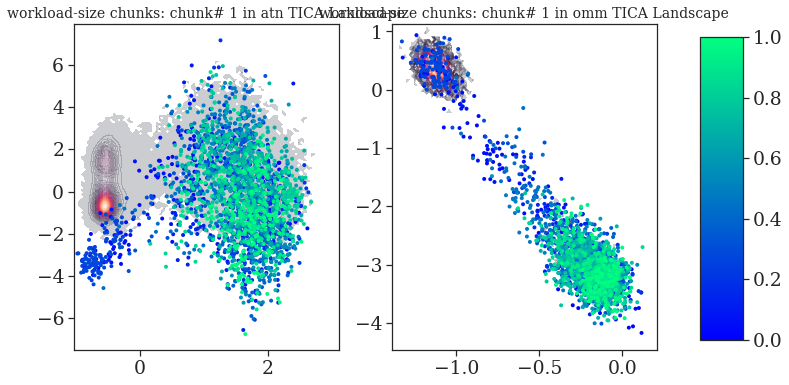

In [17]:
for feat,nm in [("invca","xma_Ca"), ("invca_ba","xma_CB")]:

    dds = da / nm
    if not dds.is_dir():
        dds.mkdir()
    
    w = workflows[nm]
    
    featurizer   = pyemma.coordinates.featurizer(topologies[heavies])
    aswa.apply_feat_part(featurizer, feature_selections[feat])
    feature_data = pyemma.coordinates.source(w["tica_inputs"], featurizer)

    master_tica  = dict(
        atn = aswa_tools.get_matching_input(
            all_models[feat]["anton_longtraj"]["tica"],
            key="lag", val=chosen_lag),
        omm = aswa_tools.get_matching_input(
            all_models[feat]["openmm_longtraj"]["tica"],
            key="lag", val=chosen_lag),
    )
    
    workflow_in_master_tica = {
        k: v.transform(feature_data.get_output())
        for k,v in master_tica.items()
    }
    
    master_in_master_tica   = {
        k: v.get_output([0,1])[0]
        for k,v in master_tica.items()
    }

    for iw,(r_start,r_stop) in enumerate(aswa_tools.partition_workflow(w)):
        if iw > 1:
            break

        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
        for i,wnm in enumerate(["atn","omm"]):#workflow_in_master_tica:
            
            workload_in_master_tica = np.concatenate(workflow_in_master_tica[wnm][r_start:r_stop])
            workload_colors = matplotlib.cm.winter(plt.Normalize()(list(range(workload_in_master_tica.shape[0]))))
            
            pyemma.plots.plot_density(
                *master_in_master_tica[wnm].T,
                ax=ax[i],
                alpha=0.2,
                cbar=False
            )
            sc = ax[i].scatter(
            #seaborn.scatterplot(
                x=workload_in_master_tica.T[0],
                y=workload_in_master_tica.T[1],
                #x=initials_in_master_tica.T[0],
                #y=initials_in_master_tica.T[1],
                #ax=ax,
                c=workload_colors,
                linewidth=0,
                s=16,
            )
            sc.set_cmap("winter")
            ax[i].set_title("workload-size chunks: chunk# %d in %s TICA Landscape"%(iw,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.8)
        cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
        fig.colorbar(sc, cax=cbar_ax)
        
        #cb = plt.colorbar(sc)
        #cb.ax.set_ylabel("frame number")
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analysis/%s/workloads-%d-chunk_on_tica_landscape.png"%(nm, iw), dpi=900)

#### OpenMM Long Traj on Anton Landscape

05-12-19 12:32:38 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[24] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features
05-12-19 12:33:13 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[26] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features


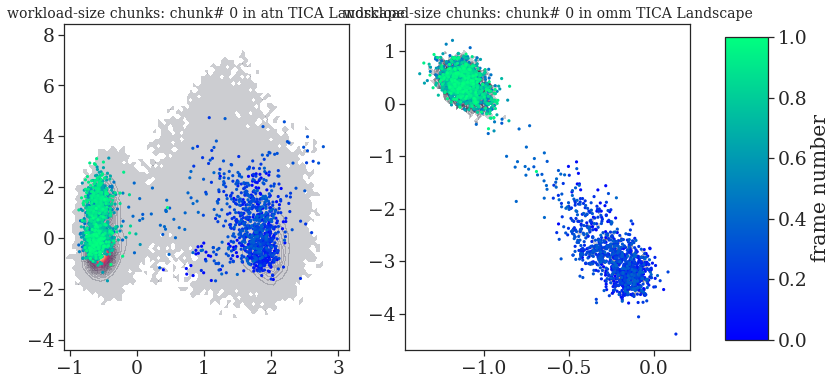

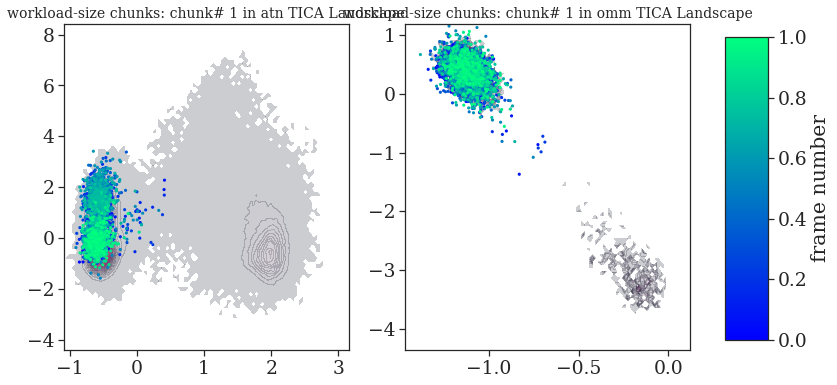

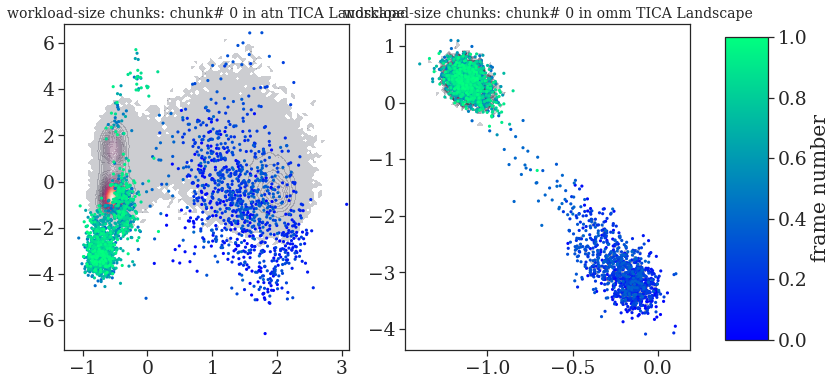

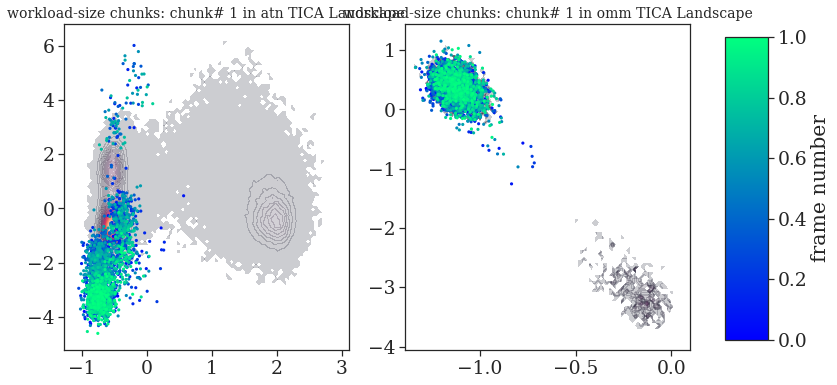

In [18]:
w_actual = workflows["xma_Ca"]
n_frames_workload = sum([ttj.shape[0] for ttj in w_actual["ttrajs"][:w_actual["n_trajs"]]])

for feat,nm in [("invca","omm"), ("invca_ba","omm")]:
    
    w = workflows[nm]
    
    featurizer   = pyemma.coordinates.featurizer(topologies[heavies])
    aswa.apply_feat_part(featurizer, feature_selections[feat])
    feature_data = pyemma.coordinates.source(w["tica_inputs"], featurizer)
    
    master_tica  = dict(
        atn = aswa_tools.get_matching_input(
            all_models[feat]["anton_longtraj"]["tica"],
            key="lag", val=chosen_lag),
        omm = aswa_tools.get_matching_input(
            all_models[feat]["openmm_longtraj"]["tica"],
            key="lag", val=chosen_lag),
    )
    
    workflow_in_master_tica = {
        k: np.concatenate(v.transform(feature_data.get_output()))
        for k,v in master_tica.items()
    }
    
    master_in_master_tica   = {
        k: v.get_output([0,1])[0]
        for k,v in master_tica.items()
    }
    
    for iw in range(workflow_in_master_tica["atn"].shape[0]//n_frames_workload):
        if iw > 1:
            break

        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
        for i,wnm in enumerate(["atn","omm"]):#workflow_in_master_tica:
            
            workload_in_master_tica = workflow_in_master_tica[wnm][iw*n_frames_workload:(1+iw)*n_frames_workload]
            workload_colors = matplotlib.cm.winter(plt.Normalize()(list(range(workload_in_master_tica.shape[0]))))
            
            pyemma.plots.plot_density(
                *master_in_master_tica[wnm].T,
                ax=ax[i],
                alpha=0.2,
                cbar=False
            )
            sc = ax[i].scatter(
                x=workload_in_master_tica.T[0],
                y=workload_in_master_tica.T[1],
                c=workload_colors,
                linewidth=0,
                s=10,
            )
            sc.set_cmap("winter")
            ax[i].set_title("workload-size chunks: chunk# %d in %s TICA Landscape"%(iw,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
        cb = fig.colorbar(sc, cax=cbar_ax)
        cb.ax.set_ylabel("frame number")
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analysis/openmm_longtraj/wkl-%d-chunk_on_tica_landscape.png"%(iw), dpi=900)

05-12-19 12:33:47 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[28] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features
05-12-19 12:34:12 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[30] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features


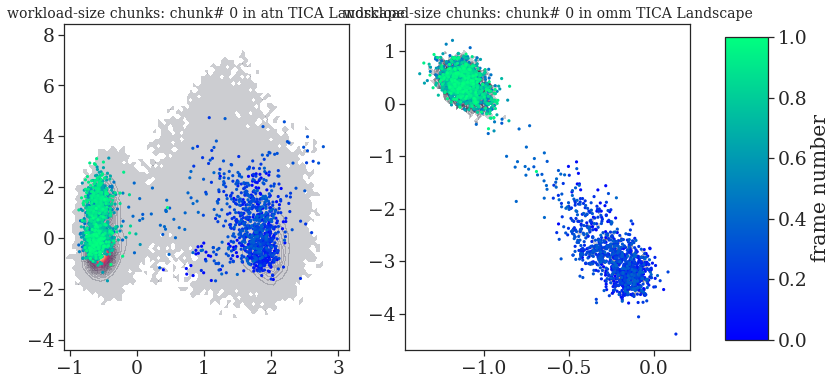

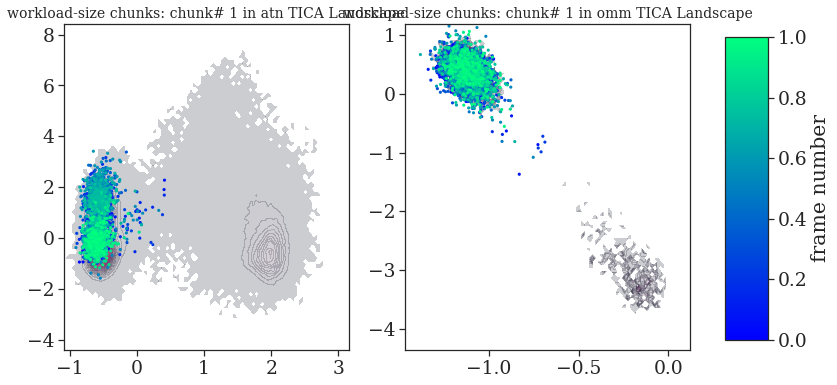

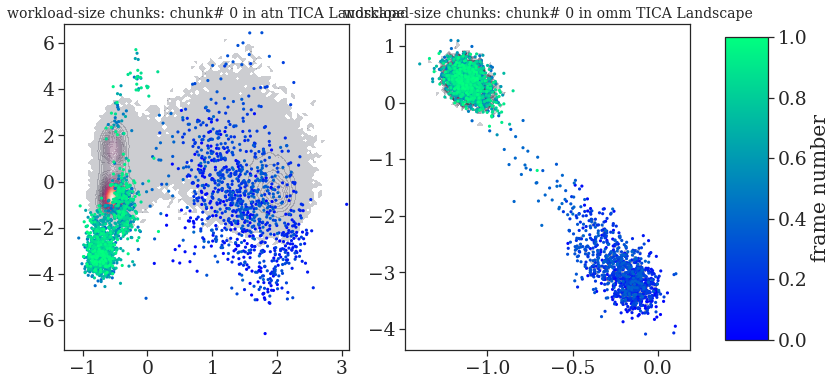

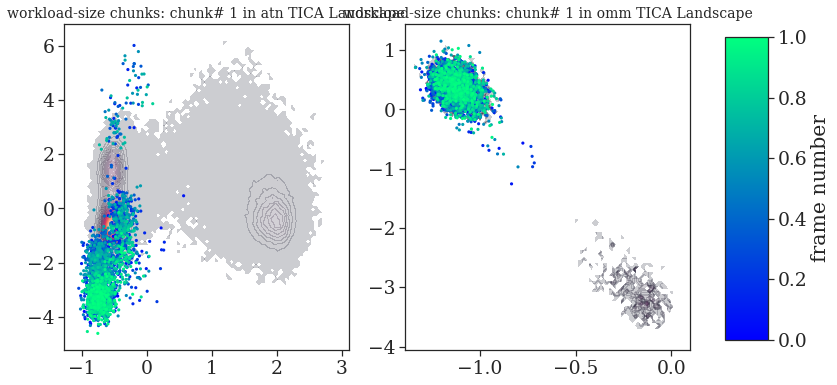

In [19]:
w_actual = workflows["xma_Ca"]
n_frames_workload = sum([ttj.shape[0] for ttj in w_actual["ttrajs"][:w_actual["n_trajs"]]])

for feat,nm in [("invca","omm"), ("invca_ba","omm")]:
    
    w = workflows[nm]
    
    featurizer   = pyemma.coordinates.featurizer(topologies[heavies])
    aswa.apply_feat_part(featurizer, feature_selections[feat])
    feature_data = pyemma.coordinates.source(w["tica_inputs"], featurizer)
    
    master_tica  = dict(
        atn = aswa_tools.get_matching_input(
            all_models[feat]["anton_longtraj"]["tica"],
            key="lag", val=chosen_lag),
        omm = aswa_tools.get_matching_input(
            all_models[feat]["openmm_longtraj"]["tica"],
            key="lag", val=chosen_lag),
    )
    
    workflow_in_master_tica = {
        k: np.concatenate(v.transform(feature_data.get_output()))
        for k,v in master_tica.items()
    }
    
    master_in_master_tica   = {
        k: v.get_output([0,1])[0]
        for k,v in master_tica.items()
    }
    
    for iw in range(workflow_in_master_tica["atn"].shape[0]//n_frames_workload):
        if iw > 1:
            break

        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
        for i,wnm in enumerate(["atn","omm"]):#workflow_in_master_tica:
            
            workload_in_master_tica = workflow_in_master_tica[wnm][iw*n_frames_workload:(1+iw)*n_frames_workload]
            workload_colors = matplotlib.cm.winter(plt.Normalize()(list(range(workload_in_master_tica.shape[0]))))
            
            pyemma.plots.plot_density(
                *master_in_master_tica[wnm].T,
                ax=ax[i],
                alpha=0.2,
                cbar=False
            )
            sc = ax[i].scatter(
                x=workload_in_master_tica.T[0],
                y=workload_in_master_tica.T[1],
                c=workload_colors,
                linewidth=0,
                s=10,
            )
            sc.set_cmap("winter")
            ax[i].set_title("workload-size chunks: chunk# %d in %s TICA Landscape"%(iw,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
        cb = fig.colorbar(sc, cax=cbar_ax)
        cb.ax.set_ylabel("frame number")
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analysis/openmm_longtraj/wkl-%d-chunk_on_tica_landscape.png"%(iw), dpi=900)

#### OpenMM FIXED Long Traj on Anton Landscape

05-12-19 12:34:41 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[32] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features
05-12-19 12:35:00 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[34] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features


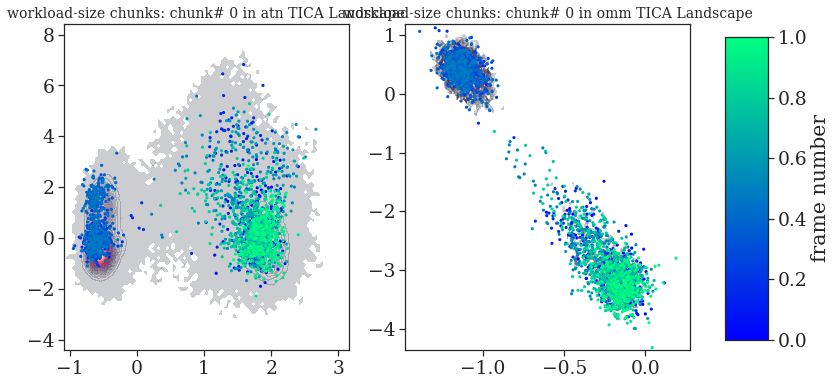

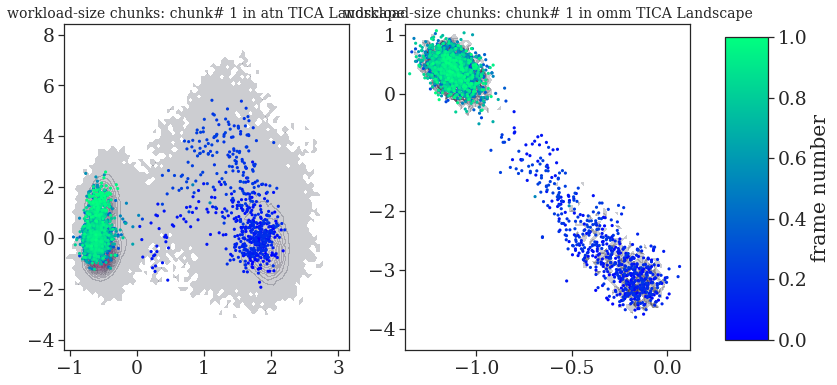

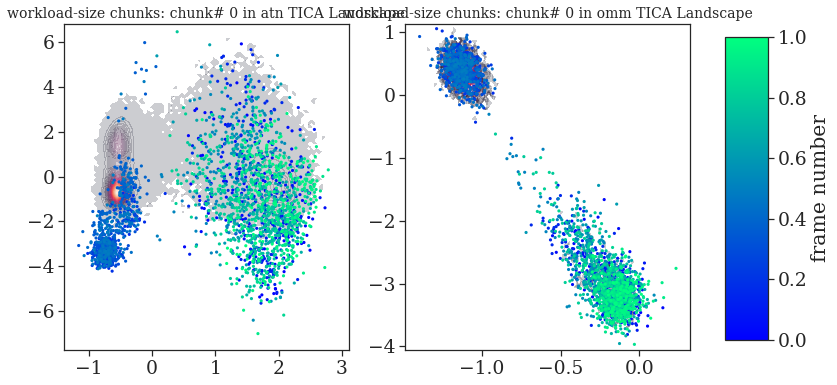

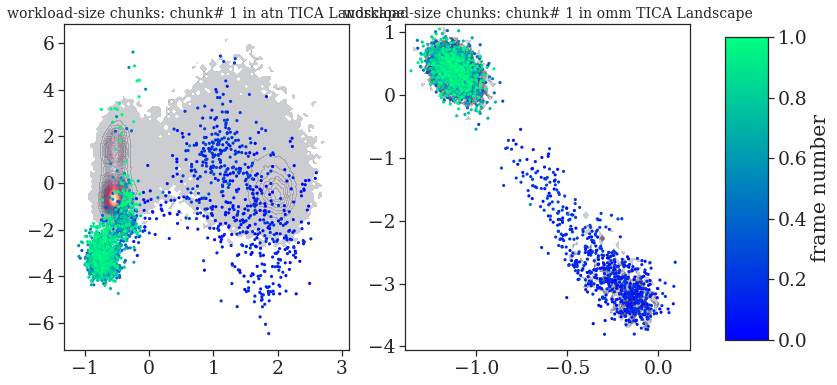

In [20]:
w_actual = workflows["xma_Ca"]
n_frames_workload = sum([ttj.shape[0] for ttj in w_actual["ttrajs"][:w_actual["n_trajs"]]])

for feat,nm in [("invca","omm_fixed"), ("invca_ba","omm_fixed")]:
    
    w = workflows[nm]
    
    featurizer   = pyemma.coordinates.featurizer(topologies[heavies])
    aswa.apply_feat_part(featurizer, feature_selections[feat])
    feature_data = pyemma.coordinates.source(w["tica_inputs"], featurizer)
    
    master_tica  = dict(
        atn = aswa_tools.get_matching_input(
            all_models[feat]["anton_longtraj"]["tica"],
            key="lag", val=chosen_lag),
        omm = aswa_tools.get_matching_input(
            all_models[feat]["openmm_longtraj"]["tica"],
            key="lag", val=chosen_lag),
    )
    
    workflow_in_master_tica = {
        k: np.concatenate(v.transform(feature_data.get_output()))
        for k,v in master_tica.items()
    }
    
    master_in_master_tica   = {
        k: v.get_output([0,1])[0]
        for k,v in master_tica.items()
    }
    
    for iw in range(workflow_in_master_tica["atn"].shape[0]//n_frames_workload):
        if iw > 1:
            break

        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
        for i,wnm in enumerate(["atn","omm"]):#workflow_in_master_tica:
            
            workload_in_master_tica = workflow_in_master_tica[wnm][iw*n_frames_workload:(1+iw)*n_frames_workload]
            workload_colors = matplotlib.cm.winter(plt.Normalize()(list(range(workload_in_master_tica.shape[0]))))
            
            pyemma.plots.plot_density(
                *master_in_master_tica[wnm].T,
                ax=ax[i],
                alpha=0.2,
                cbar=False
            )
            sc = ax[i].scatter(
                x=workload_in_master_tica.T[0],
                y=workload_in_master_tica.T[1],
                c=workload_colors,
                linewidth=0,
                s=10,
            )
            sc.set_cmap("winter")
            ax[i].set_title("workload-size chunks: chunk# %d in %s TICA Landscape"%(iw,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
        cb = fig.colorbar(sc, cax=cbar_ax)
        cb.ax.set_ylabel("frame number")
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analysis/openmm_longtraj/wkl-%d-chunk_on_tica_landscape.png"%(iw), dpi=900)

In [22]:
feat = "invca"
nm   = "omm"
w    = workflows[nm]
featurizer   = pyemma.coordinates.featurizer(topologies[heavies])
aswa.apply_feat_part(featurizer, feature_selections[feat])
feature_data = pyemma.coordinates.source(w["tica_inputs"], featurizer)
    
master_tica  = aswa_tools.get_matching_input(
    all_models[feat]["anton_longtraj"]["tica"],
    key="lag", val=chosen_lag)
    
workflow_in_master_tica = master_tica.transform(
    feature_data.get_output())

master_in_master_tica = master_tica.get_output([0,1])[0]


05-12-19 12:37:21 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[38] WARNING  The 1D arrays input for add_inverse_distances() have been sorted, and index duplicates have been eliminated.
Check the output of describe() to see the actual order of the features


In [ ]:
    for iw in range(workflow_in_master_tica["atn"].shape[0]//n_frames_workload):
        if iw > 1:
            break

        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
        for i,wnm in enumerate(["atn","omm"]):#workflow_in_master_tica:
            
            workload_in_master_tica = workflow_in_master_tica[wnm][iw*n_frames_workload:(1+iw)*n_frames_workload]
            workload_colors = matplotlib.cm.winter(plt.Normalize()(list(range(workload_in_master_tica.shape[0]))))
            
            pyemma.plots.plot_density(
                *master_in_master_tica[wnm].T,
                ax=ax[i],
                alpha=0.2,
                cbar=False
            )
            sc = ax[i].scatter(
                x=workload_in_master_tica.T[0],
                y=workload_in_master_tica.T[1],
                c=workload_colors,
                linewidth=0,
                s=10,
            )
            sc.set_cmap("winter")
            ax[i].set_title("workload-size chunks: chunk# %d in %s TICA Landscape"%(iw,wnm), fontsize=14)
        
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.89, 0.15, 0.05, 0.7])
        cb = fig.colorbar(sc, cax=cbar_ax)
        cb.ax.set_ylabel("frame number")
        
        #fig.tight_layout() # doesn't know about extra add_axes call?
        plt.savefig("analysis/openmm_longtraj/wkl-%d-chunk_on_tica_landscape.png"%(iw), dpi=900)

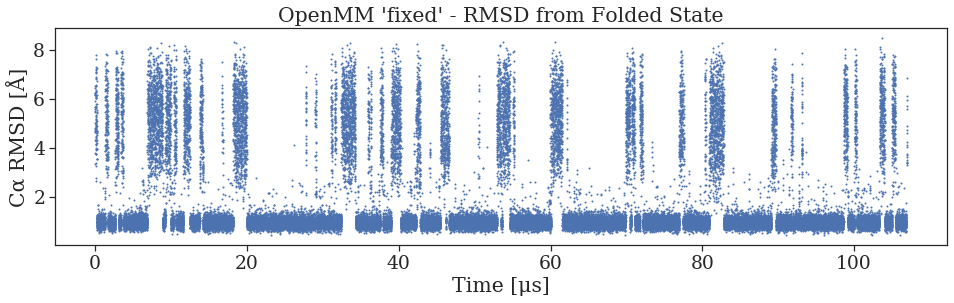

In [21]:
us_per_step_openmm = 0.00002
traj_file = workflows["omm_fixed"]["filename"]
top_file  = topologies[protein]

label_alphies   = "Cα RMSD [Å]"
label_timesteps = "Time [μs]"

folded_file     = reference[heavies]
folded_heavies  = mdtraj.load(folded_file)
folded_alphies  = folded_heavies.atom_slice(
    folded_heavies.topology.select("name CA"))

traj_anton_heavies = mdtraj.load(traj_file_anton, top=top_file_anton)
traj_anton_alphies = traj_anton_heavies.atom_slice(
    traj_anton_heavies.topology.select("name CA"))

anton_rmsd_df = pandas.DataFrame({
    label_alphies   : mdtraj.rmsd(traj_anton_alphies, folded_alphies) * 10,
    label_timesteps : [i * us_per_step_anton
        for i in range(len(traj_anton_heavies))]
})

# This data looks terrible
plt.close()
plt.figure(figsize=(16, 4))

ax = seaborn.scatterplot(
    x=anton_rmsd_df[label_timesteps][::10],
    y=anton_rmsd_df[label_alphies][::10],
    linewidth=0,
    s=4,
    #data=traj_rmsd_df,
    legend=False,
)

ax.set_title("OpenMM 'fixed' - RMSD from Folded State")
plt.savefig("analysis/tica-rmsd-heavyatoms-openmm_fixed-full.png", dpi=1200)

## <center>3. Discretization to State Space with Clustering</center>

####  3.1 Do regular space and k-means clustering operations

<center><mark><span style="color:darkred">Try a series of cluster counts for k-means, series of intercluster distances for regular-space</span></mark></center>

<center>Actually loading if in notebook, must run this code outside notebook to calculate (i.e. in an HPC job)</center>

In [19]:
# FIXME Dask IT!!
for feat,nm,dataset in aswa_tools.iter_models(all_models):
    #print()
    #print("ON TO: ", feat, nm)
    dds       = da / nm
    dkmeans   = dds / "kmeans"
    dregspace = dds / "regspace"
    fkmeans   = dkmeans / "results.pyemma"
    fregspace = dregspace / "results.pyemma"

    if not dkmeans.is_dir():
        dkmeans.mkdir()
    if not dregspace.is_dir():
        dregspace.mkdir()

    for setup in dataset["cluster_kmeans"]:
        _fkmeans = fkmeans.with_suffix(".%s"%_model_name(feat, setup["kwargs"]))
        
        if _fkmeans.is_file():
            #print("Found Results File: {}".format(_fkmeans))
            setup["result"] = pyemma.load(_fkmeans)
            
        else:
            #print("Calculating and Saving to File: {}".format(_fkmeans))
            if not setup["input"]:
                setup["input"] = aswa_tools.get_matching_input(
                    dataset["tica"], key="lag", val=chosen_lag)
                # SUM TING WONG with TICA object
                setup["input"]._default_chunksize = 10000
            
            tica_inp = np.array(np.concatenate(
                setup["input"].get_output(
                    list(range(n_tica_dim)))
                ), dtype=np.float64)
            
            setup["result"] = coor.cluster_kmeans(tica_inp, **setup["kwargs"])
            setup["result"].save(_fkmeans, save_streaming_chain=True)

    for setup in dataset["cluster_regspace"]:
        _fregspace = fregspace.with_suffix(".%s"%_model_name(feat, setup["kwargs"]))

        if not setup["input"]:
            setup["input"] = aswa_tools.get_matching_input(
                dataset["tica"], key="lag", val=chosen_lag)
            # SUM TING WONG with TICA object
            setup["input"]._default_chunksize = 10000
                
        tica_inp = np.array(np.concatenate(
            setup["input"].get_output(
                list(range(n_tica_dim)))
            ), dtype=np.float64)
            
        mindist = np.power(np.product([
            mx-mn for mn,mx in zip(
                np.min(tica_inp[:,:n_tica_dim], axis=0),
                np.max(tica_inp[:,:n_tica_dim], axis=0))
        ]), 1./n_tica_dim) / 25.
        
        setup["actual-dmin"] = setup["kwargs"]["dmin"] * mindist
            
        if _fregspace.is_file():
            #print("Found Results File: {}".format(_fregspace))
            setup["result"] = pyemma.load(_fregspace)
            
        else:
            #print("Calculating and Saving to File: {}".format(_fregspace))
            
            setup["result"] = aswa_tools.refined_regspace(tica_inp, mindist, **setup["kwargs"])
            setup["result"].save(_fregspace, save_streaming_chain=True)

<center><mark style="background-color:green"><span style="color:white"> Sanity check for k-means results </span></mark></center>

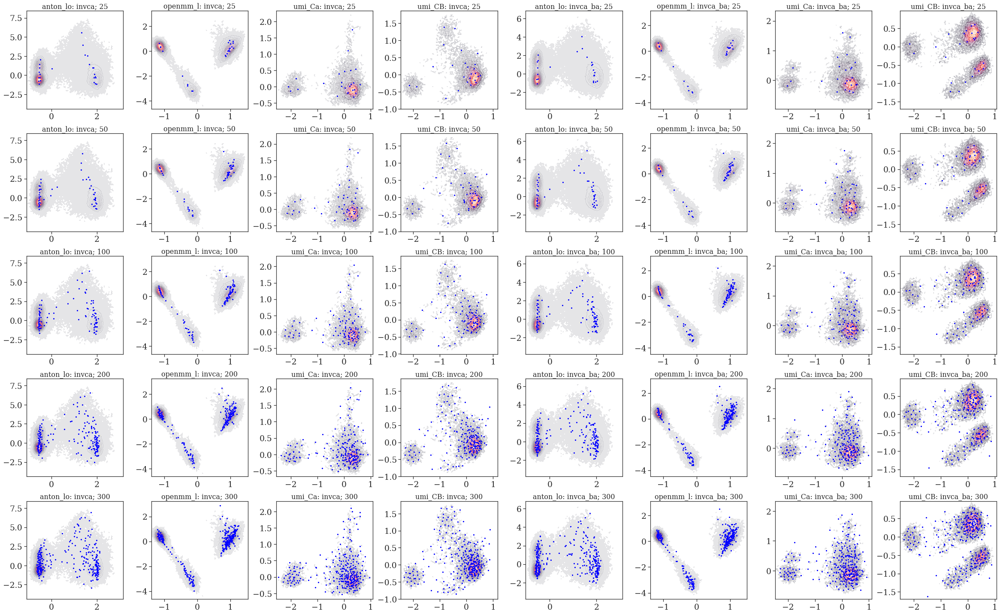

In [20]:
clust_method = "kmeans"

n_datasets = len([_ for feat,nm,dataset in aswa_tools.iter_models(all_models)])
n_configs = len(next(aswa_tools.iter_models(all_models))[-1]["cluster_%s"%clust_method])

fig, axes = plt.subplots(n_configs, n_datasets, figsize=(4*n_datasets, 4*n_configs))

for i,(feat,nm,dataset) in enumerate(aswa_tools.iter_models(all_models)):
    tica_inp = np.array(np.concatenate(aswa_tools.get_matching_input(
        dataset["tica"], key="lag", val=chosen_lag).get_output()
    ))[:,:2]
    
    for j,setup in enumerate(dataset["cluster_%s"%clust_method]):
        
        pyemma.plots.plot_density(*tica_inp.T, cbar=False, alpha=0.1, ax=axes[j][i])
        
        seaborn.scatterplot(
            x=setup["result"].clustercenters[:,0],
            y=setup["result"].clustercenters[:,1],
            s=10,
            ax=axes[j][i],
            legend=False,
            color=cc_color,
            linewidth=0,
        )
        
        axes[j][i].set_title("%s: %s; %d" % (nm[:8], feat, setup["result"].clustercenters.shape[0]), fontsize=16)

plt.tight_layout()
plt.savefig("analysis/%s-clustercenters-alldata.png"%clust_method,dpi=450)

<center><mark style="background-color:green"><span style="color:white">Sanity check for regspace results</span></mark></center>

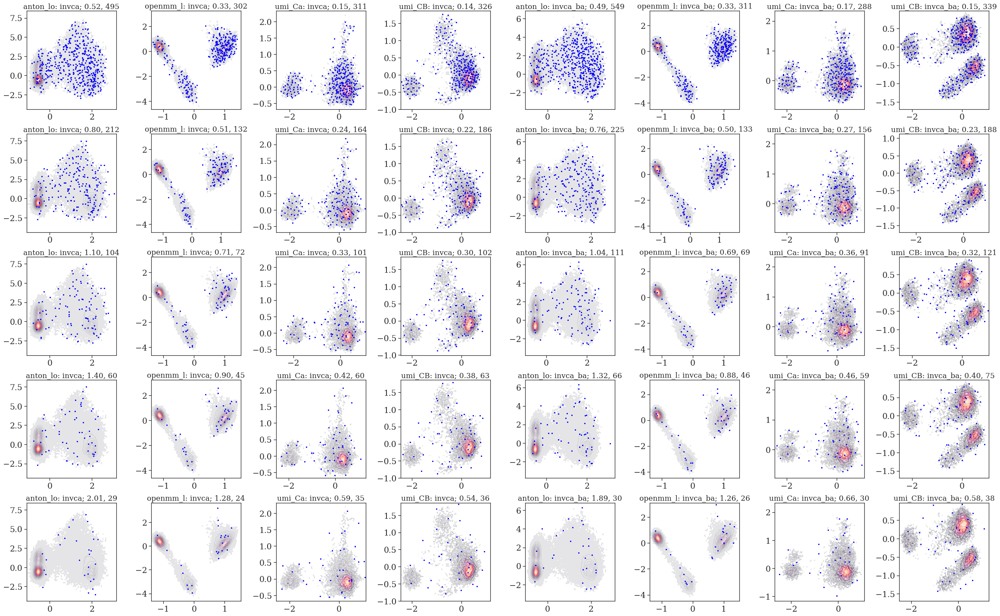

In [21]:
clust_method = "regspace"

n_datasets = len([_ for feat,nm,dataset in aswa_tools.iter_models(all_models)])
n_configs = len(next(aswa_tools.iter_models(all_models))[-1]["cluster_%s"%clust_method])

fig, axes = plt.subplots(n_configs, n_datasets, figsize=(4*n_datasets, 4*n_configs))

for i,(feat,nm,dataset) in enumerate(aswa_tools.iter_models(all_models)):
    tica_inp = np.array(np.concatenate(aswa_tools.get_matching_input(
        dataset["tica"], key="lag", val=chosen_lag).get_output()
    ))[:,:2]
    
    for j,setup in reversed(list(enumerate(dataset["cluster_%s"%clust_method]))):
        
        pyemma.plots.plot_density(*tica_inp.T, cbar=False, alpha=0.1, ax=axes[j][i])
        
        seaborn.scatterplot(
            x=setup["result"].clustercenters[:,0],
            y=setup["result"].clustercenters[:,1],
            s=10,
            ax=axes[j][i],
            legend=False,
            color=cc_color,
            linewidth=0,
        )
        
        axes[j][i].set_title("%s: %s; %0.2f, %d" % (nm[:8], feat, setup["actual-dmin"], setup["result"].clustercenters.shape[0]), fontsize=17)

plt.tight_layout()
plt.savefig("analysis/%s-clustercenters-alldata.png"%clust_method,dpi=450)

#### 3.2 Plot Implied Timescales against various State Spaces (Clusterings)

<center><mark><span style="color:darkred">
    Calculating MANY MSMs to get the ITS Plots, takes a while to load if it's already saved
</span></mark></center>

In [22]:
for feat,nm,dataset in aswa_tools.iter_models(all_models):
    
    dataset["its"] = dlits = dict()

    for clust_method, par_key in [("regspace", "dmin"), ("kmeans", "k")]:
        
        dlits[clust_method] = lits = list()
        
        dds = da / nm
        dmsm = dds / "msm"
        fits = dmsm / "its-results.pyemma"
        
        if not dmsm.is_dir():
            dmsm.mkdir()
        
        for i,setup in enumerate(dataset["cluster_%s"%clust_method]):
            
            _fits = fits.with_suffix(
                ".%s-%s"%(clust_method, _model_name(feat, setup["kwargs"])))
            
            dits           = dict()
            dits["par"]    = (par_key, setup["kwargs"][par_key])
            dits["input"]  = setup["result"].dtrajs
            dits["kwargs"] = dict(
                lags=tica_lags,
                reversible=False,
                nits=3,
                errors="bayes",
            )
            
            if not _fits.is_file():
                dits["result"] = pyemma.msm.its(
                    dits["input"],
                    **dits["kwargs"]
                )
                dits["result"].save(_fits)
            
            else:
                dits["result"] = pyemma.load(_fits)
            
            # Reverse so both with increasing N clusters
            if "regspace" in clust_method:
                lits.insert(0, dits)
            else:
                lits.append(dits)

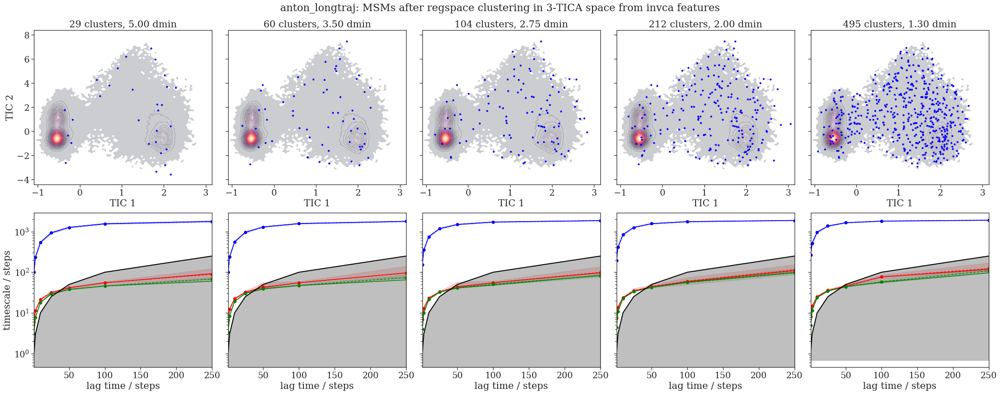

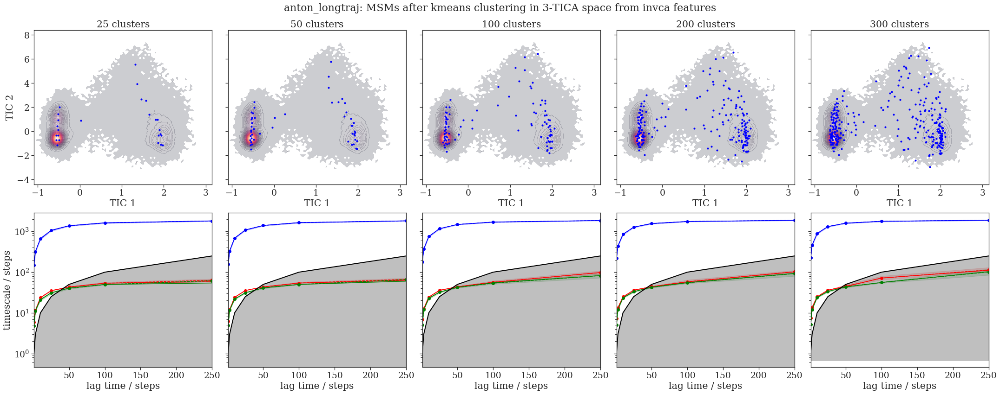

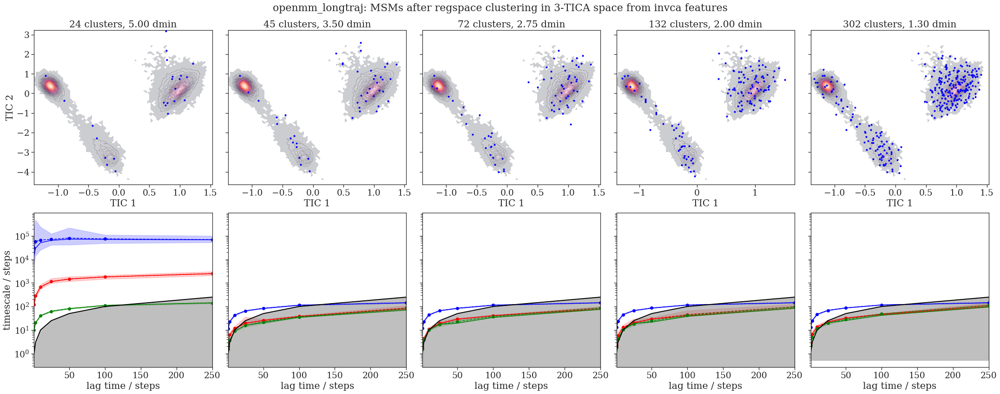

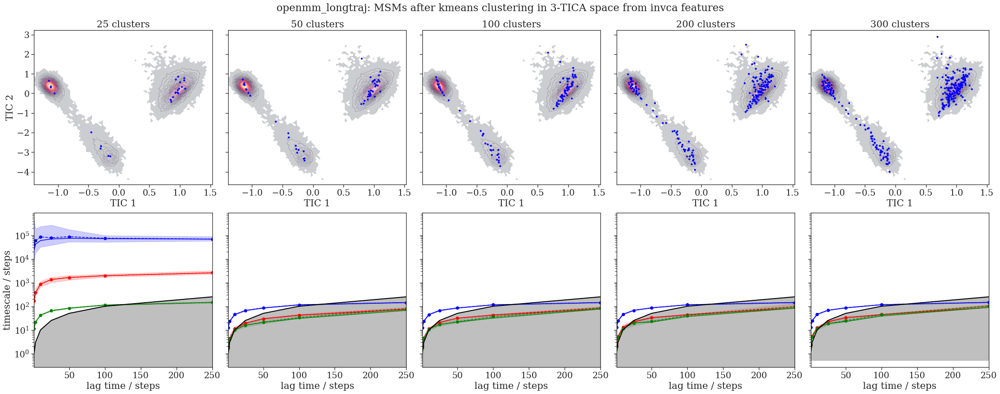

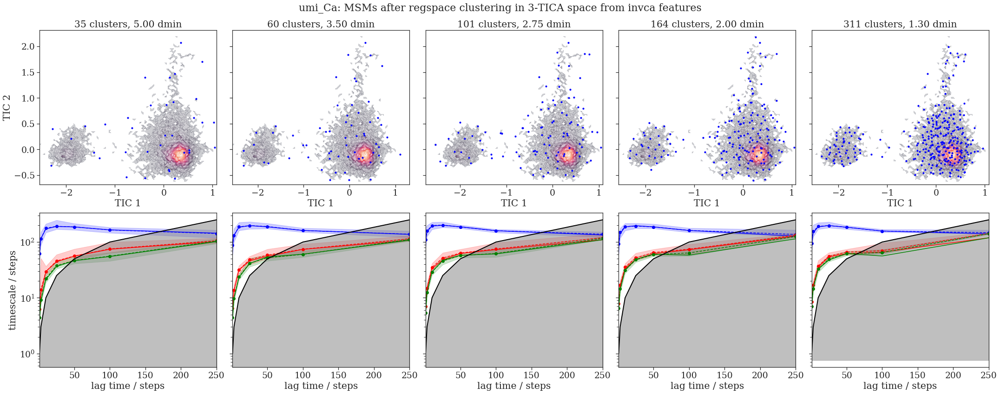

...

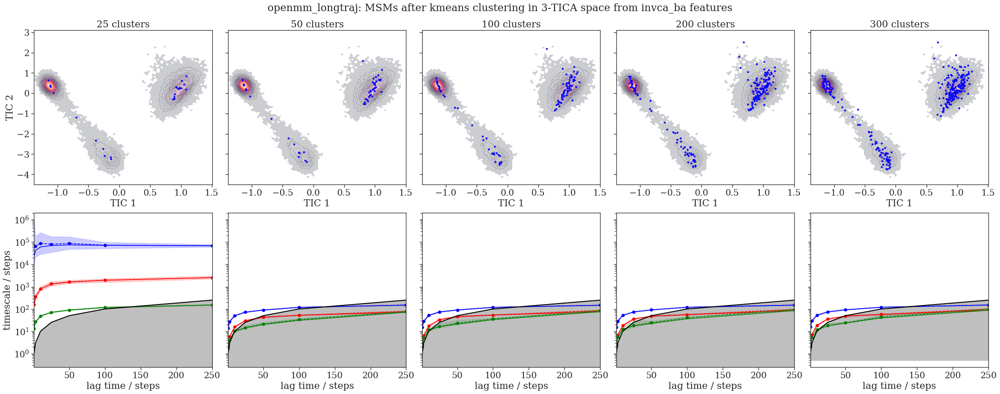

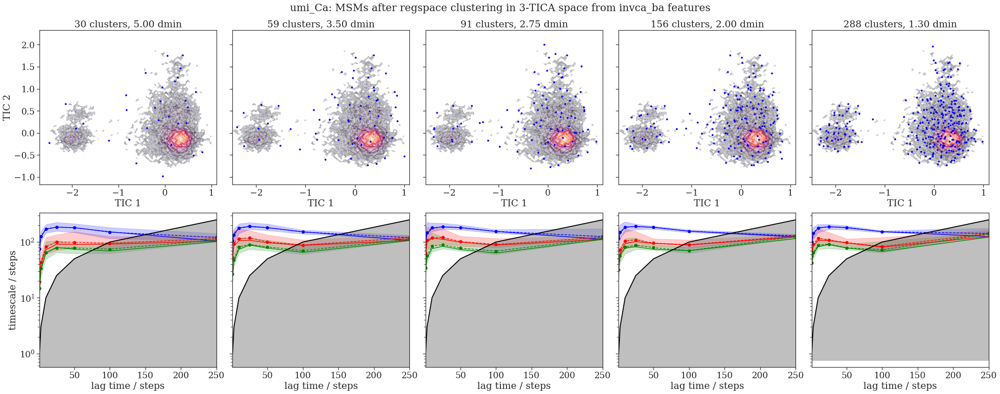

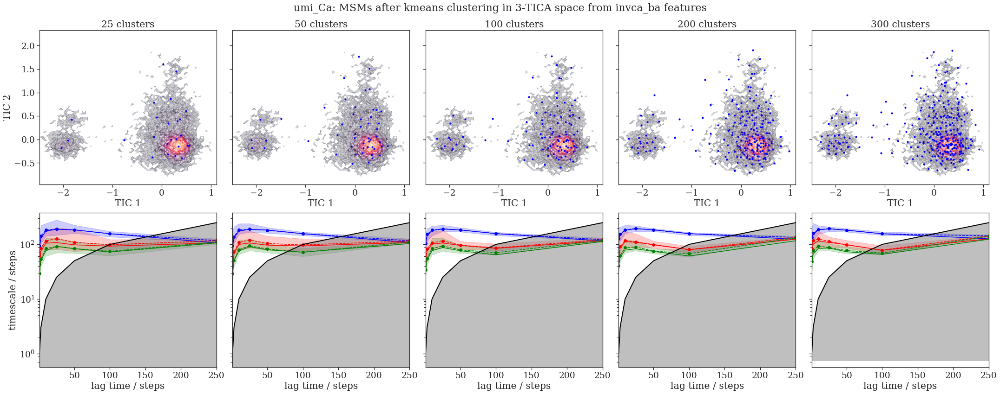

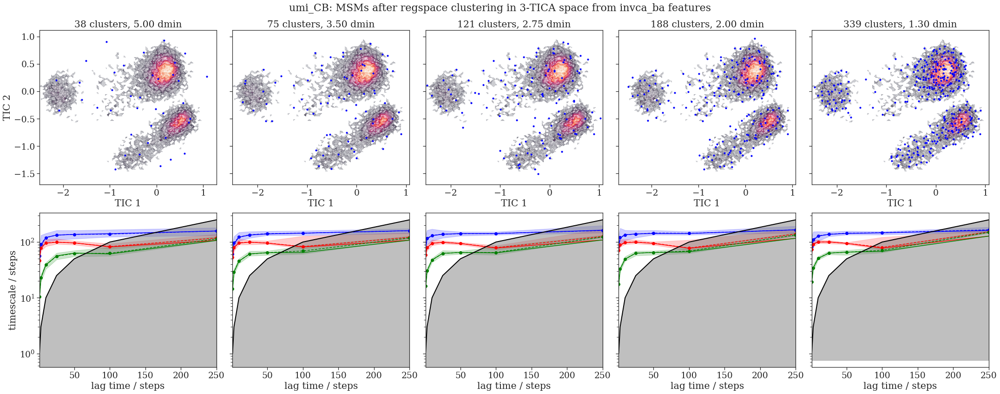

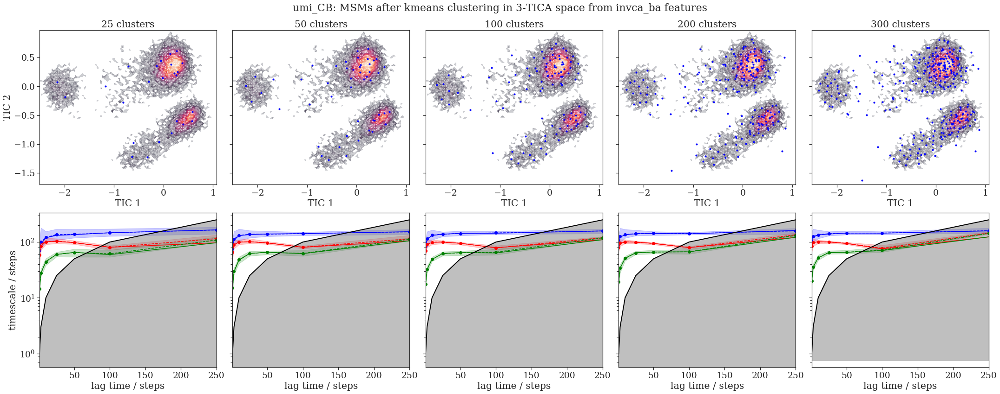

In [23]:
for feat,nm,dataset in aswa_tools.iter_models(all_models):
    
    tica_inp = np.array(np.concatenate(aswa_tools.get_matching_input(
        dataset["tica"], key="lag", val=chosen_lag).get_output(list(range(2)))
    ))
    
    for clust_method, setups in dataset["its"].items():
        
        n_configs = len(setups)
        fig, axes = plt.subplots(2, n_configs, figsize=(6*n_configs, 12), sharey="row")

        for i,setup in enumerate(setups):
            
            clustercenters = aswa_tools.get_matching_input(
                dataset["cluster_%s"%clust_method], key=setup["par"][0], val=setup["par"][1]).clustercenters
            
            pyemma.plots.plot_density(*tica_inp.T, cbar=False, alpha=0.2, ax=axes[0][i])
            
            seaborn.scatterplot(
                x=clustercenters[:,0],
                y=clustercenters[:,1],
                s=17,
                ax=axes[0][i],
                legend=False,
                color=cc_color,
                linewidth=0,
            )
            plot_title = "%d clusters" % clustercenters.shape[0]
        
            if "regspace" in clust_method:
                plot_title += ", %0.2f dmin"%setup["par"][1]

            axes[0,i].set_title(plot_title)
            axes[0,i].set_xlabel("TIC 1")
    
            if i == 0:
                axes[0,i].set_ylabel("TIC 2")
        
            pyemma.plots.plot_implied_timescales(
                setup["result"],
                ax=axes[1, i],
            )
            
            if i > 0:
                axes[1,i].yaxis.label.set_visible(False)
                #axes[2,i].yaxis.label.set_visible(False)
        
        plt.suptitle(
            "%s: MSMs after %s clustering in %d-TICA space from %s features"%(
                nm, clust_method, n_tica_dim, feat), fontsize=22,
        )
        fig.tight_layout(rect=[0, 0, 1, 0.95])
        plt.savefig("analysis/%s/ITS_%s-%s-TICA01landscapewithCC.png"%(
            nm, clust_method, feat), dpi=1200)

![title](analysis/anton_longtraj/ITS_kmeans-invca_ba-TICA01landscapewithCC.png)
![title](analysis/anton_longtraj/ITS_regspace-invca_ba-TICA01landscapewithCC.png)
![title](analysis/anton_longtraj/ITS_kmeans-invca-TICA01landscapewithCC.png)
![title](analysis/anton_longtraj/ITS_regspace-invca-TICA01landscapewithCC.png)

![title](analysis/openmm_longtraj/ITS_kmeans-invca_ba-TICA01landscapewithCC.png)
![title](analysis/openmm_longtraj/ITS_regspace-invca_ba-TICA01landscapewithCC.png)
![title](analysis/openmm_longtraj/ITS_kmeans-invca-TICA01landscapewithCC.png)
![title](analysis/openmm_longtraj/ITS_regspace-invca-TICA01landscapewithCC.png)

![title](analysis/umi_Ca/ITS_kmeans-invca_ba-TICA01landscapewithCC.png)
![title](analysis/umi_Ca/ITS_regspace-invca_ba-TICA01landscapewithCC.png)
![title](analysis/umi_Ca/ITS_kmeans-invca-TICA01landscapewithCC.png)
![title](analysis/umi_Ca/ITS_regspace-invca-TICA01landscapewithCC.png)

![title](analysis/umi_CB/ITS_kmeans-invca_ba-TICA01landscapewithCC.png)
![title](analysis/umi_CB/ITS_regspace-invca_ba-TICA01landscapewithCC.png)
![title](analysis/umi_CB/ITS_kmeans-invca-TICA01landscapewithCC.png)
![title](analysis/umi_CB/ITS_regspace-invca-TICA01landscapewithCC.png)

After looking at these results, (where we compared tons of different MSMs), it looks like a direct MSM with lag 100 ns and 400 states is a good choice as a fine-grained model of the data. 
If we can, we should always choose a direct MSM where there was no manipulation of the input data. Reversible (symmetrized) MSMs use a symmetric transition matrix, equivalent to taking each trajectory forwards and backwards, i.e. reversed.
<center>$c_{ij}'=c_{ji}'=(c_{ij}+c_{ji})/2$<\center>

 - k=50, msm lag 20 ns

In [24]:
nm         = "anton_longtraj"
chosen_k   = 50
chosen_tau = 100 # 100 * 0.2 = 20 ns
cktest_lags = [1,5,10,25,50]
n_macrostates = list(range(2,9))

for feat in [feat_Ca, feat_CB]:
    
    dds       = da / nm
    dcktest   = dds / "cktest"
    fcktest   = dcktest / "results.pyemma"

    if not dcktest.is_dir():
        dcktest.mkdir()

    dataset = all_models[feat][nm]
    
    cktests = dataset["cktest"] = list()
 
    for i in n_macrostates:
        
        setup = dict()
        setup["kwargs"] = dict(
            n = i,
            dt=0.2,
        )
        
        _fcktest = fcktest.with_suffix(".%s"%_model_name(feat, setup["kwargs"]))
        _fmsm    = _fcktest.with_suffix(_fcktest.suffix + "-bmsm")

        setup["kwargs"].update(dict(
            mlags=cktest_lags,))
        
        the_kmeans = aswa_tools.get_matching_input(
            all_models[feat][nm]["cluster_kmeans"], "k", chosen_k)
    
        if _fmsm.is_file():
            setup["input"] = pyemma.load(_fmsm)
            
        else:
            setup["input"] = pyemma.msm.bayesian_markov_model(
                the_kmeans.dtrajs,
                chosen_tau,
                dt_traj="0.2 ns"
            )
            setup["input"].save(_fmsm)
        
        if _fcktest.is_file():
            setup["result"] = pyemma.load(_fcktest)
            
        else:
            setup["result"] = setup["input"].cktest(
                i, mlags=cktest_lags)

            setup["result"].save(_fcktest)

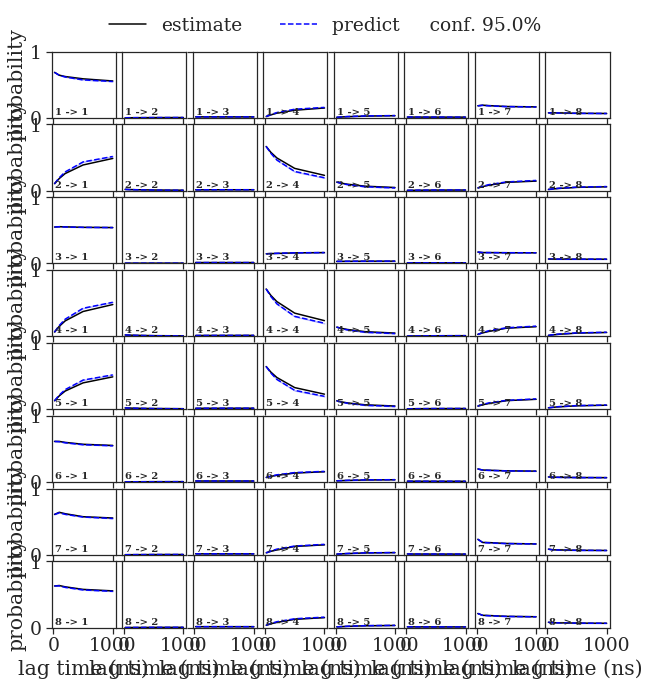

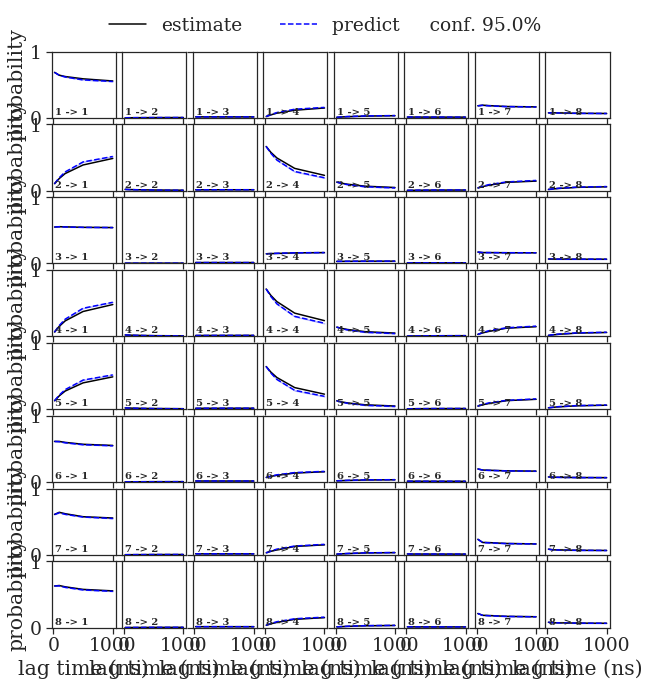

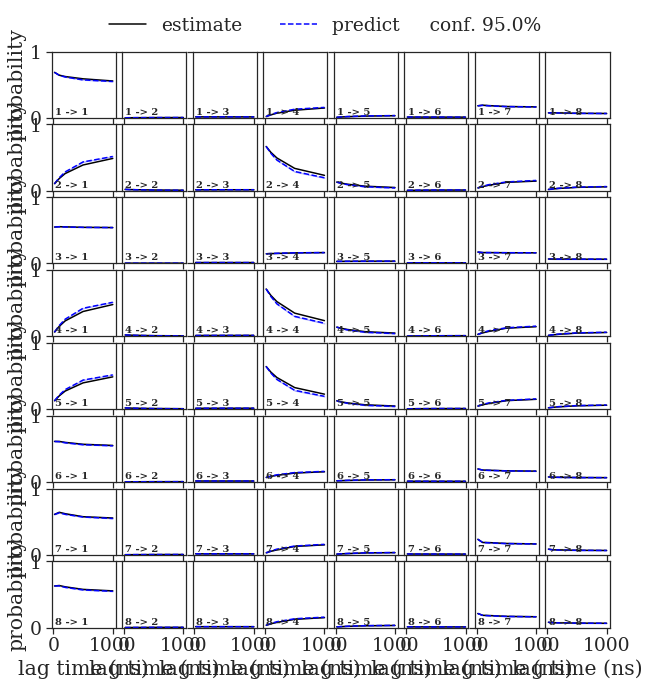

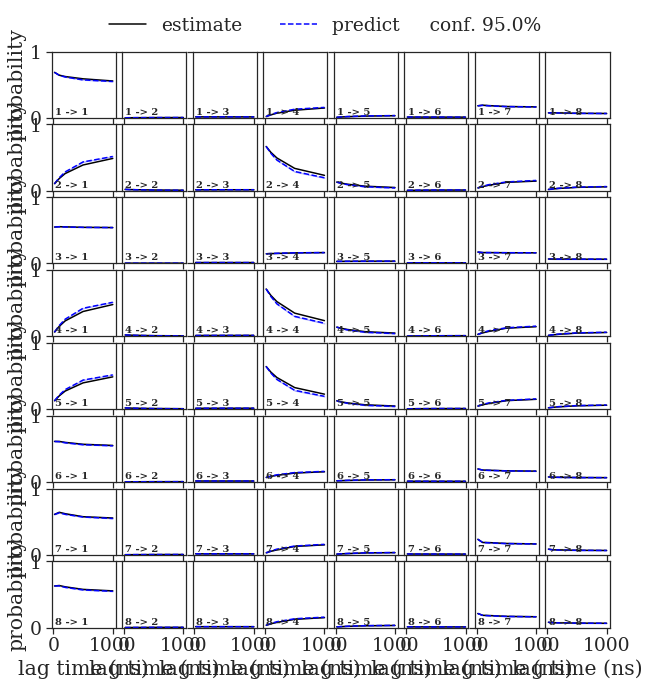

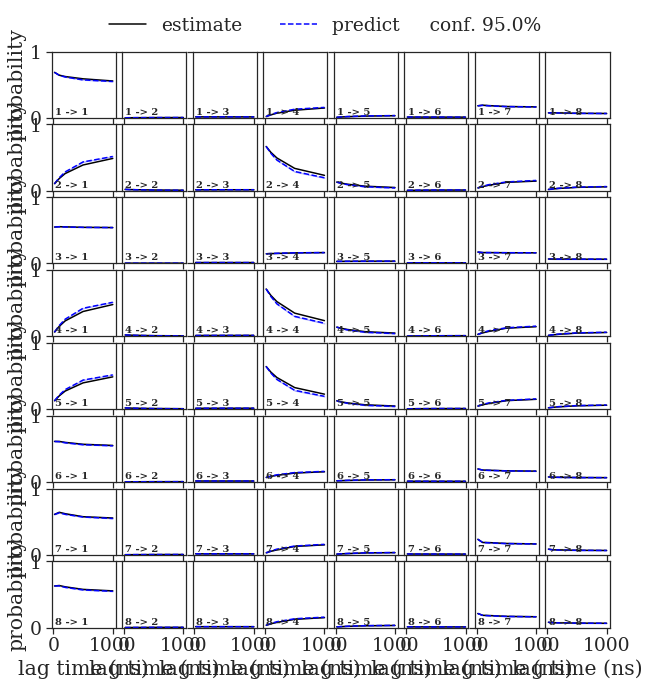

...

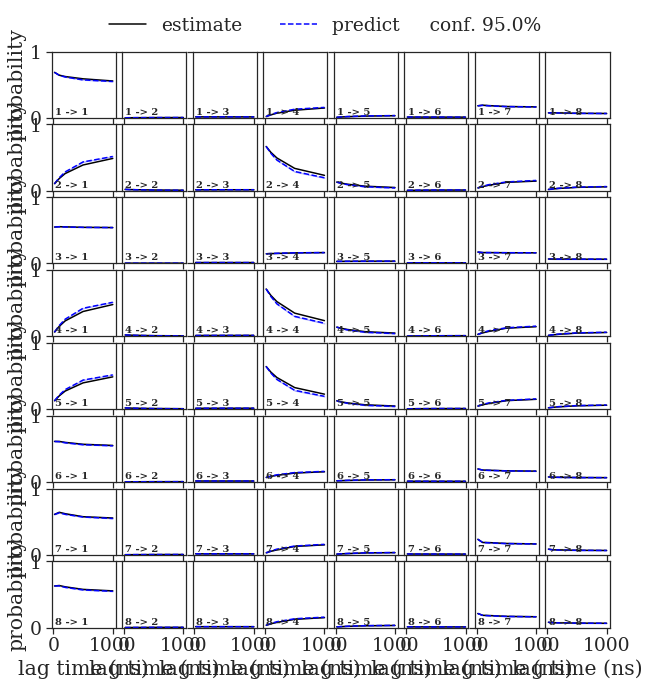

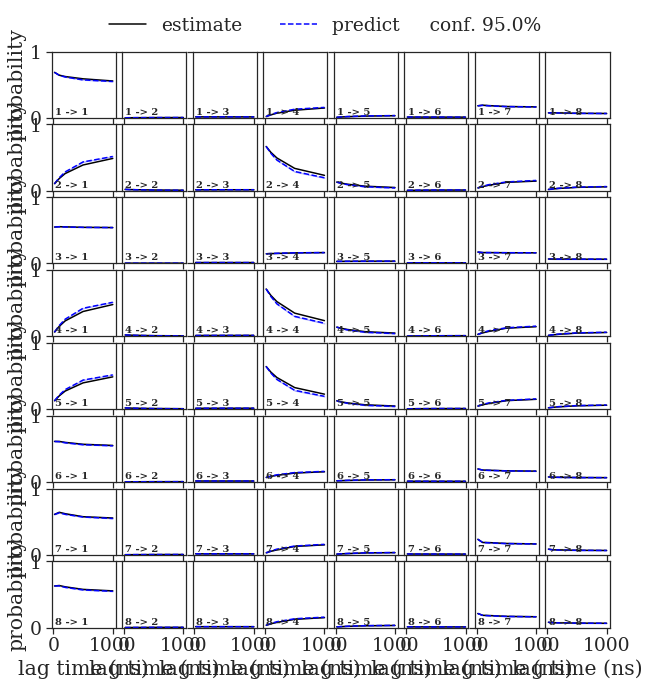

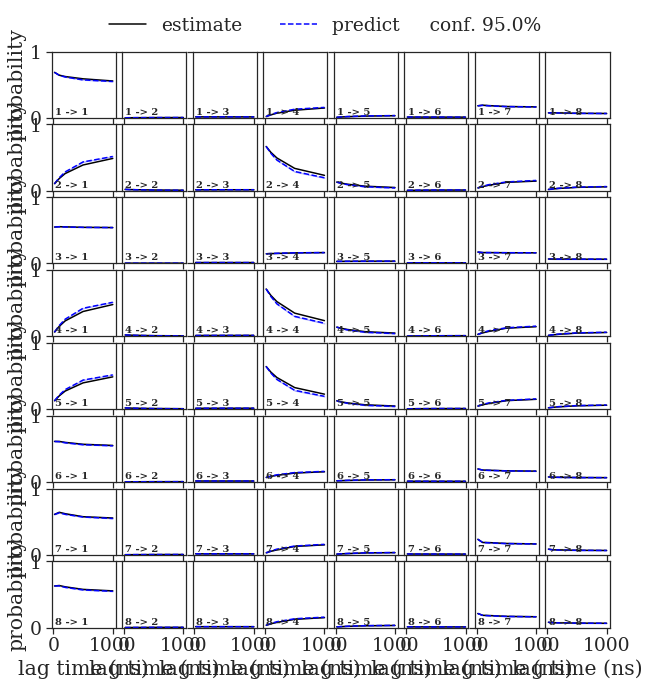

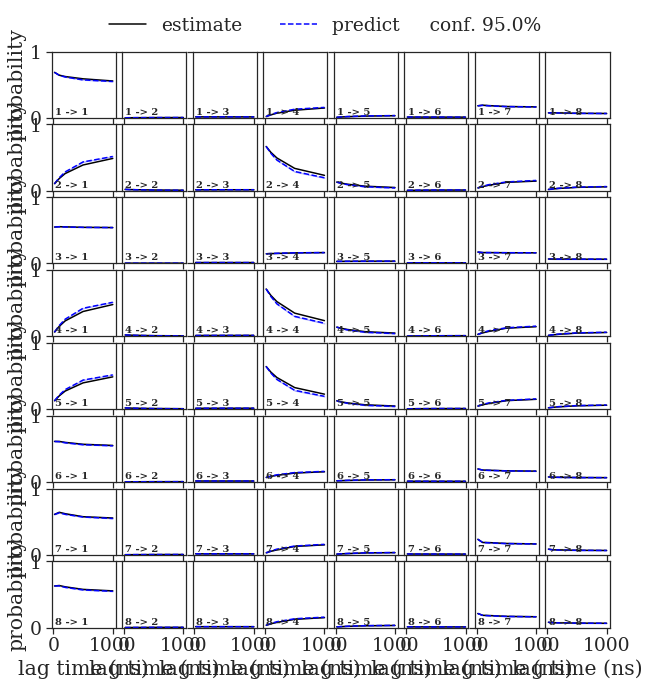

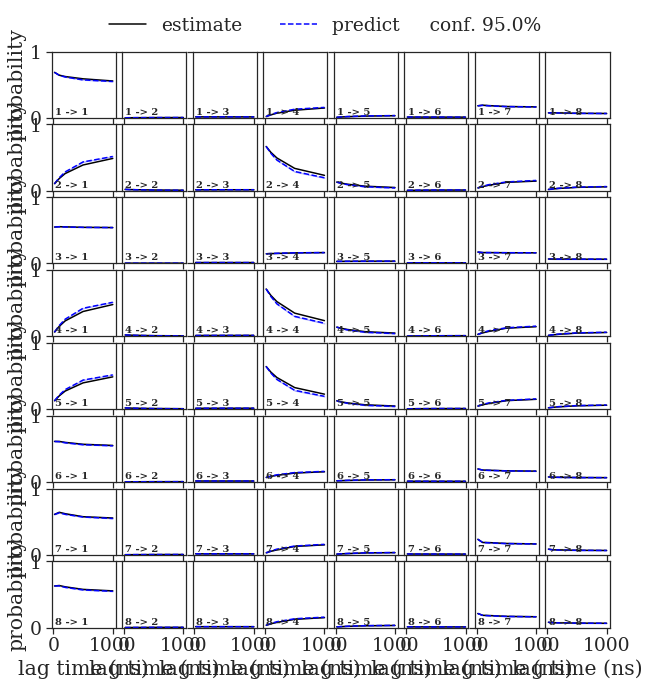

In [25]:
nm         = "anton_longtraj"
chosen_k   = 50
chosen_tau = 100 # 100 * 0.2 = 20 ns
cktest_lags = [1,5,10,25,50]
n_macrostates = list(range(2,9))

for feat in [feat_Ca, feat_CB]:
    dds       = da / nm
    dcktest   = dds / "cktest"
    fcktest   = dcktest / "results.pyemma"

    for i in n_macrostates:
        pyemma.plots.plot_cktest(
            setup["result"],
            dt=0.2,
            units="ns")
        #fig.tight_layout()
        plt.savefig("analysis/anton_longtraj/CKtest-%d_state-kmeans_%d-msm_%d.png"%(i, chosen_k, chosen_tau))

In [26]:
colors_2state = ["red", "blue"]

if True:
    plt.close()
    plt.figure(figsize=(16, 4))

    ax = seaborn.scatterplot(
        x=anton_rmsd_df[label_timesteps][::10],
        y=anton_rmsd_df[label_alphies][::10],
        linewidth=0,
        s=4,
        color=colors_2state[anton_2state.dtrajs[::10]],
        #data=traj_rmsd_df,
        legend=False,
    )

    ax.set_title("Anton: 2-state, RMSD from Folded")
    plt.savefig("rmsd-heavyatoms-anton-full.png", dpi=1200)

NameError: name 'anton_2state' is not defined

<Figure size 1152x288 with 0 Axes>

In [25]:
pyemma.plots.plot_cktest(anton_bmsm.cktest(6, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

NameError: name 'anton_bmsm' is not defined

In [ ]:
pyemma.plots.plot_cktest(anton_bmsm.cktest(5, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

In [ ]:
pyemma.plots.plot_cktest(anton_bmsm.cktest(4, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

In [ ]:
the_kmeans = analtools.get_matching_input(all_models[feat_CB]["anton_longtraj"]["cluster_kmeans"], "k", 50)
anton_bmsm  = pyemma.msm.bayesian_markov_model(best_kmeans.dtrajs, chosen_tau, dt_traj="0.2 ns")
pyemma.plots.plot_cktest(anton_bmsm.cktest(3, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

In [ ]:
the_kmeans = analtools.get_matching_input(all_models[feat_CB]["anton_longtraj"]["cluster_kmeans"], "k", 50)
anton_bmsm  = pyemma.msm.bayesian_markov_model(best_kmeans.dtrajs, chosen_tau, dt_traj="0.2 ns")
pyemma.plots.plot_cktest(anton_bmsm.cktest(2, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

 - k=100, msm lag 20 ns

In [ ]:
the_kmeans = analtools.get_matching_input(all_models[feat_CB]["anton_longtraj"]["cluster_kmeans"], "k", 100)
anton_bmsm  = pyemma.msm.bayesian_markov_model(best_kmeans.dtrajs, chosen_tau, dt_traj="0.2 ns")
pyemma.plots.plot_cktest(anton_bmsm.cktest(2, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

 - k=50, msm lag 40 ns

In [ ]:
the_kmeans = analtools.get_matching_input(all_models[feat_CB]["anton_longtraj"]["cluster_kmeans"], "k", 50)
anton_bmsm  = pyemma.msm.bayesian_markov_model(best_kmeans.dtrajs, 200, dt_traj="0.2 ns")
pyemma.plots.plot_cktest(anton_bmsm.cktest(2, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

 - k=100, msm lag 40 ns

In [ ]:
the_kmeans = analtools.get_matching_input(all_models[feat_CB]["anton_longtraj"]["cluster_kmeans"], "k", 100)
anton_bmsm  = pyemma.msm.bayesian_markov_model(best_kmeans.dtrajs, 200, dt_traj="0.2 ns")
pyemma.plots.plot_cktest(anton_bmsm.cktest(2, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

#### MSM onto TICA landscape

In [ ]:
eigvec = anton_bmsm.eigenvectors_right()

#fig, axes = plt.subplots(2, 3, figsize=(12, 6))
#for i, ax in enumerate(axes.flat):
#    pyemma.plots.plot_contour(
#        *tica_concatenated.T, eigvec[dtrajs_concatenated, i + 1], ax=ax, cmap='PiYG',
#        cbar_label='{}. right eigenvector'.format(i + 2), mask=True)
#    ax.scatter(*cluster.clustercenters.T, s=15, c='C1')
#    ax.set_xlabel('IC 1')
#    ax.set_ylabel('IC 2')
#fig.tight_layout()

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(12, 6))
for i,ax in enumerate(axes.flat):
    pyemma.plots.plot_contour(
        *tica_data_CB[:,:2].T, eigvec[best_kmeans.dtrajs[0], i + 1], cmap="PiYG",
        cbar_label='{}. right eigenvector'.format(i + 2), mask=True, ax=ax)

    ax.scatter(*best_kmeans.clustercenters.T[:2], s=15, c='C1', zorder=10)

In [ ]:
eigvec = anton_regspace_bmsm.eigenvectors_right()

fig, axes = plt.subplots(2, 3, figsize=(12, 6))
for i,ax in enumerate(axes.flat):
    pyemma.plots.plot_contour(
        *tica_data_CB[:,:2].T, eigvec[regspace.dtrajs[0], i + 1], cmap="PiYG",
        cbar_label='{}. right eigenvector'.format(i + 2), mask=True, ax=ax)

    ax.scatter(*regspace.clustercenters.T[:2], s=15, c='C1', zorder=10)

In [ ]:
#the_kmeans = analtools.get_matching_input(all_models[feat_CB]["anton_longtraj"]["cluster_kmeans"], "k", 50)
anton_regspace_bmsm  = pyemma.msm.bayesian_markov_model(regspace.dtrajs, 200, dt_traj="0.2 ns")
pyemma.plots.plot_cktest(anton_regspace_bmsm.cktest(2, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

In [ ]:
pyemma.plots.plot_cktest(anton_regspace_bmsm.cktest(3, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(anton_regspace_bmsm.cktest(4, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(anton_regspace_bmsm.cktest(5, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(anton_regspace_bmsm.cktest(6, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(anton_regspace_bmsm.cktest(7, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(anton_regspace_bmsm.cktest(8, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

In [ ]:
new_dtrajs, new_centers = refined_regspace(regspace, np.array(tica_data_CB[:,:3], dtype=np.float64))
new_regspace_bmsm = pyemma.msm.bayesian_markov_model(new_dtrajs, 200, dt_traj="0.2 ns")
eigvec = new_regspace_bmsm.eigenvectors_right()

fig, axes = plt.subplots(2, 3, figsize=(12, 6))
for i,ax in enumerate(axes.flat):
    pyemma.plots.plot_contour(
        *tica_data_CB[:,:2].T, np.squeeze(eigvec[new_dtrajs, i + 1]), cmap="PiYG",
        cbar_label='{}. right eigenvector'.format(i + 2), mask=True, ax=ax)

    ax.scatter(*new_centers.T[:2], s=15, c='C1', zorder=10)
    
plt.savefig("msm-eigenstuff.png", dpi=1200)

In [ ]:
pyemma.plots.plot_cktest(new_regspace_bmsm.cktest(3, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(new_regspace_bmsm.cktest(4, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(new_regspace_bmsm.cktest(5, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(new_regspace_bmsm.cktest(6, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(new_regspace_bmsm.cktest(7, mlags=[1,5,10,25,50]), dt=0.2, units="ns")
pyemma.plots.plot_cktest(new_regspace_bmsm.cktest(8, mlags=[1,5,10,25,50]), dt=0.2, units="ns")

In [ ]:
the_kmeans = analtools.get_matching_input(all_models[feat_CB]["anton_longtraj"]["cluster_kmeans"], "k", 50)
anton_bmsm  = pyemma.msm.bayesian_markov_model(the_kmeans.dtrajs, chosen_tau, dt_traj="0.2 ns")

In [ ]:
hmm = pyemma.msm.estimate_hidden_markov_model(the_kmeans.dtrajs, 5, chosen_tau, reversible=False)

In [ ]:
fig,ax = plt.subplots(1, 1,figsize=(5,5))
seaborn.heatmap(hmm.P, cmap="PuRd", ax=ax)
ax.set_ylim(hmm.nstates+0.5, -0.5)

In [ ]:
fig,ax = plt.subplots(1, 1,figsize=(5,1))
seaborn.heatmap(hmm.stationary_distribution[:,np.newaxis].T, cmap="PuRd", ax=ax, annot=True, annot_kws={"size": 12, "weight": "bold"})
#ax.set_ylim(+0.5, -0.5)
ax.get_yaxis().set_visible(False)
plt.savefig("stationary-distribution-5states.png", dpi=1200)